In [9]:
# uses conda activate r62GEDI !!!!!!!!!!

import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
from pyproj import CRS
import numpy as np
# import xarray as xr
import datetime
from datetime import date, timedelta
import rasterio
import os
import copy 
import pickle
import sys
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from sklearn.metrics import r2_score, mean_absolute_percentage_error

sys.path.append('/home/r62/repos/russ_repos/Functions/')
from STANDARD_FUNCTIONS import read_pickle, write_pickle, find_list_mismatch, runcmd, mask_df_to_x
from STATISTICS import summary_statistics
from DATA_ANALYSIS_FUNCTIONS import normalize_df, split_train_val_test
from VISUALIZATION_FUNCTIONS import Color_Palettes
from TIME import Pandas_Time_Converter, create_list_of_dates
from REMOTE_SENSING_FUNCTIONS import pixel_extraction_tool_Daymet

path_to_breakup_records = '/mnt/locutus/remotesensing/r62/river_ice_breakup/Breakup_Data'
path_to_outputs = '/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/DAYMET'

PERC_TRAIN = 0.6
PERC_VAL = 0.2

palettes = Color_Palettes()
col_blind_friendly_palette = palettes.color_blind_friendly()
color_blind_colors = palettes.color_blind_colors

sys.path.append('/home/r62/repos/russ_repos/river_ice_breakup')
from RIVER_ICE_FUNCTIONS import presentation_vs_poster

In [10]:
import tensorflow as tf
import numpy as np
import pandas as pd
import sys
import os

sys.path.append('/home/r62/repos/russ_repos/Functions/')
from TF_FUNCTIONS import df_to_LSTM
base_directory = '/mnt/locutus/remotesensing/r62/river_ice_breakup/ERA5/monthly_forecasts/differing_spans'
MONTH = 'march'
ENSEMBLE = 31
LOOKBACK_WINDOW = 457

ens_x = pd.read_pickle(f'{base_directory}/{MONTH}/processed/ensembles/ENSEMBLE_{ENSEMBLE}.pkl').drop('Location', axis = 1)

In [11]:
ens_x_lstm = df_to_LSTM(ens_x, LOOKBACK_WINDOW)

In [12]:
ens_x_lstm.shape

(36044, 457, 15)

In [14]:
ens_x.iloc[LOOKBACK_WINDOW-1:, :].shape

(36044, 15)

In [2]:
model_path = '/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_Results/Models/temp_iterative_evaluation/iterative_models/best_model_2014.keras'
new_model = tf.keras.models.load_model(model_path)
new_model.summary()

2024-09-10 13:45:37.348089: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64/mpich-3.2/lib:/home/r62/anaconda3/lib:/home/r62/anaconda3/lib
2024-09-10 13:45:37.349379: W tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:265] failed call to cuInit: UNKNOWN ERROR (303)
2024-09-10 13:45:37.349464: I tensorflow/compiler/xla/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (theseus.ornl.gov): /proc/driver/nvidia/version does not exist
2024-09-10 13:45:37.350074: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with 

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 masking_2 (Masking)         (None, 457, 15)           0         
                                                                 
 lstm_2 (LSTM)               (None, 256)               278528    
                                                                 
 dense_4 (Dense)             (None, 256)               65792     
                                                                 
 dense_5 (Dense)             (None, 1)                 257       
                                                                 
Total params: 344,577
Trainable params: 344,577
Non-trainable params: 0
_________________________________________________________________


In [8]:
data = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_Daymet_datasets/DAYMET_20_LOCATIONS_PRE_LSTM.pkl')
train_X = data['train_df']
train_X = df_to_LSTM(train_X, window_size=457)
train_X.shape

(192264, 457, 15)

In [2]:
def date_difference(df_by_site):
    df_by_site.sort_values(by='year', inplace = True)
    differences, plot_dates = [], []
    for (key, data) in df_by_site.groupby('year'):
        predicted = data.loc[data.Predicted_Breakup == 1, 'dates']
        actual = data.loc[data.actuals == 1, 'dates']
        if predicted.shape != actual.shape:
            pass
        else:
            diff = predicted.dt.dayofyear.values - actual.dt.dayofyear.values
            differences.append(diff)
            plot_dates.append(pd.to_datetime(predicted))

    return np.concatenate(differences), pd.Series(plot_dates)


# Functions

In [2]:
def get_missing_years(DF):
    missing_years = pd.DataFrame()
    SITE = []
    yr_miss = []
    yr_range = []
    sites = []
    number_of_events = []
    for site in DF.groupby(['Location', 'River']):

        x = site[1]
        sites.append(site[0])
        SITE.append(' '.join(site[0]))
        
        number_of_events.append(len(x))
        full_time_series = np.arange(x.Year.min(), x.Year.max())
        yr_miss.append(find_list_mismatch(full_time_series, np.array(x['Year'])))
        yr_range.append((x.Year.min(), x.Year.max()))
    
    missing_years['Number of Breakup Events'] = np.array(number_of_events)
    missing_years['Site'] = SITE
    missing_years['Year Range'] = yr_range
    missing_years['Years Missing'] = yr_miss
    missing_years.set_index('Site', inplace=True)
    
    return missing_years

def get_breakup_dates_by_yr(data_by_site):
    d = copy.copy(data_by_site)
    year = d.set_index('dates').index.year
    d['year'] = year
    predicted_breakup_dates = []
    for yr in np.sort(np.unique(np.array(year))):
        data_for_year = d[d['year'] == yr]
        predicted_breakup_dates.append(data_for_year[data_for_year['preds'] == data_for_year['preds'].max()]['dates'].dt.date)
    return np.squeeze(np.array(predicted_breakup_dates))

def find_pred_vs_actual_mismatch(predicted_break_up_dates, true_break_up_dates):

    true_breakup_years = []
    pred_breakup_years = []

    for p in predicted_break_up_dates:
        pred_breakup_years.append(p.year)

    for t in true_break_up_dates:
        true_breakup_years.append(t.year)

    mismatch_years = find_list_mismatch(true_breakup_years, pred_breakup_years)
    
    if mismatch_years == []:
        mismatch_years = 'NONE'
    
    return mismatch_years


def date_difference(list1, list2, absolute):
    result = []
    for date1 in list1:
        year1 = date1.year
        for date2 in list2:
            year2 = date2.year
            if year1 == year2:
                
                if absolute:
                    difference = abs(date1 - date2).days
                else:
                    difference = (date1 - date2).days
                result.append(difference)
                break
    return np.array(result)

def get_distance(probs, true_labels, start_distance, increment):
    peaks = np.array([])
    
    if len(true_labels) > 1:
    
        while true_labels.sum() != len(peaks):
            peaks, _ = find_peaks(probs, distance=start_distance)
            start_distance += increment
            
    elif len(true_labels) == 1:
        
        while true_labels != len(peaks):
            peaks, _ = find_peaks(probs, distance=start_distance)
            start_distance += increment
            
    else:
        print('true_labels must be a list containing either \n an integer or the values themselves')
        
    return peaks


In [11]:
# To see your plotting params
# plt.rcParams.keys()

## Seeing how many total unique sites/rivers there are

In [4]:
break_up_data = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/Breakup_Data/01_PROCESSED_BREAK_UP_DATA_WEBSCRAPED.pkl')
number_of_unique_locations = []
for i in break_up_data.groupby(['River', 'Location']):
    number_of_unique_locations.append(i[0])
    
print('NUMBER OF UNIQUE LOCATIONS:', len(number_of_unique_locations))
print('NUMBER OF UNIQUE RIVERS/WATER BODIES:', np.unique(np.array(break_up_data['River'])).shape[0])

NUMBER OF UNIQUE LOCATIONS: 394
NUMBER OF UNIQUE RIVERS/WATER BODIES: 242


## Catching errors in the APRFC Dates

In [5]:
break_up_data['Breakup Year'] = break_up_data['Breakup Date'].dt.year
mismatched_rows = break_up_data[break_up_data['Breakup Year'] != break_up_data['Year']]
mismatched_rows

,River,Location,Year,Breakup Date,Site,Breakup Year
2143,Chena River,Fairbanks,1959,2017-05-01,Fairbanks Chena River,2017
5107,Yukon River,Beaver,2023,2022-05-15,Beaver Yukon River,2022
5117,Kuskokwim River,Aniak,2023,2022-05-15,Aniak Kuskokwim River,2022
5165,Yukon River,Alakanuk,2024,2023-05-24,Alakanuk Yukon River,2023
5208,Tanana River,Fairbanks D-S of Chena R,2024,2023-04-30,Fairbanks D-S of Chena R Tanana River,2023
5215,Colville River,Colville Village,2024,2023-06-08,Colville Village Colville River,2023
5226,Yukon River,Emmonak,2024,2023-05-24,Emmonak Yukon River,2023


In [63]:
break_up_data.loc[(break_up_data.Site == 'Fairbanks Chena River') & (break_up_data.Year == 1959), 'Breakup Date'] = pd.to_datetime('1959-05-01')
break_up_data.loc[(break_up_data.Site == 'Emmonak Yukon River') & (break_up_data.Year == 2024), 'Breakup Date'] = pd.to_datetime('2024-05-24')
break_up_data.loc[(break_up_data.Site == 'Aniak Kuskokwim River') & (break_up_data.Year == 2023), 'Breakup Date'] = pd.to_datetime('2023-05-15')
break_up_data.loc[(break_up_data.Site == 'Beaver Yukon River') & (break_up_data.Year == 2023), 'Breakup Date'] = pd.to_datetime('2023-05-15')
break_up_data.loc[(break_up_data.Site == 'Alakanuk Yukon River') & (break_up_data.Year == 2024), 'Breakup Date'] = pd.to_datetime('2024-05-24')
break_up_data.loc[(break_up_data.Site == 'Fairbanks D-S of Chena R Tanana River') & (break_up_data.Year == 2024), 'Breakup Date'] = pd.to_datetime('2024-04-30')
break_up_data.loc[(break_up_data.Site == 'Colville Village Colville River') & (break_up_data.Year == 2024), 'Breakup Date'] = pd.to_datetime('2024-06-08')

### The times it happened in February

In [4]:
break_up_data[break_up_data['Breakup Date'].dt.month == 2]

,River,Location,Year,Breakup Date,Site
184,Cook Inlet,Anchorage,1917,1917-02-21,Anchorage Cook Inlet
737,Chilkat River,Klukwan,1941,1941-02-19,Klukwan Chilkat River
1360,Salmon River,Gustavus,1951,1951-02-14,Gustavus Salmon River
1454,Petersburg Lake,Petersburg,1952,1952-02-26,Petersburg Petersburg Lake
1589,Unuk River,Unuk River,1953,1953-02-28,Unuk River Unuk River
1612,Unuk River,Unuk River,1954,1954-02-06,Unuk River Unuk River
1835,Bering Sea,St. George Island,1956,1956-02-25,St. George Island Bering Sea
1895,Harris Creek,Hollis,1956,1956-02-07,Hollis Harris Creek
1913,Indian Creek,Hollis,1956,1956-02-07,Hollis Indian Creek
1934,Maybeso Creek,Hollis,1956,1956-02-07,Hollis Maybeso Creek


## Find best locations for Daymet Analysis

In [6]:
save_df = False
minimum_number_of_dates = 20 # lowest number of breakup events I will consider for evaluation
start_year = 1980 # Start of Daymet there are 43 years from 1980 till 2023
end_year = break_up_data.Year.max()
optimal_number = 35 # 35 years with breakup events is determined below

In [7]:
summary_table = pd.DataFrame()
truncated_df = break_up_data[break_up_data.Year >= start_year]

for site in truncated_df.groupby(['Site']):
    min_year = site[1].Year.min()
    max_year = site[1].Year.max()
    years_available = site[1].Year
    years_test_against = np.arange(min_year, max_year+1)
    missing_years = list(np.setdiff1d(years_test_against, years_available))

    entry = {site[0]: [len(years_available),
                       (min_year, max_year),
                        missing_years ]}
    entry = pd.DataFrame.from_dict(entry, orient='index')
    summary_table = pd.concat([summary_table, entry], ignore_index=False)

summary_table.columns = ['Number of Breakup Events',	'Year Range', 'Years Missing']
summary_table = summary_table[summary_table['Number of Breakup Events'] > optimal_number]
summary_table.sort_index(inplace=True)

if save_df:
    filename = input('Provide file name (ending in .pkl) for this table: \n')
    summary_table.to_pickle(f'{path_to_breakup_records}/{filename}')

/tmp/ipykernel_36650/2534735901.py:4: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  for site in truncated_df.groupby(['Site']):


# Creating Preliminary Plots

### Plots of number of breakup events by month and justification for threshold

NameError: name 'number_of_breakup_events' is not defined

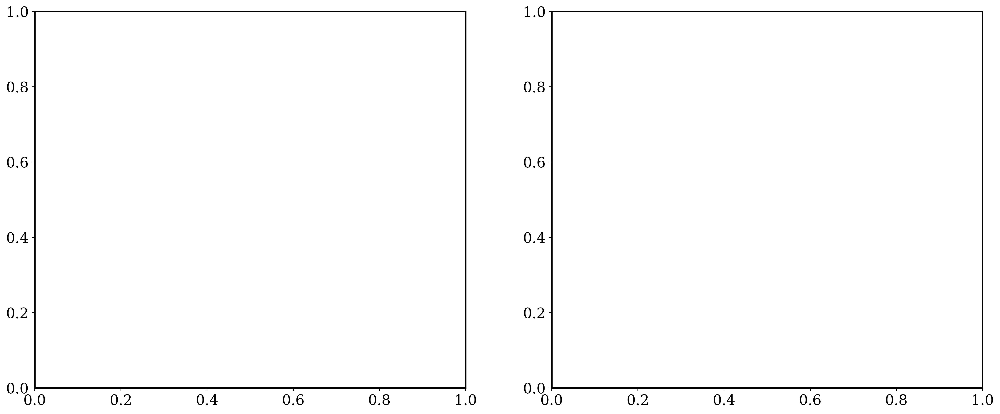

In [8]:
STYLE = 'paper'
vis = presentation_vs_poster(STYLE, (20, 8))

fig, axs = plt.subplots(nrows=1, ncols=2, sharey=False)
plt.subplots_adjust(hspace=0.25)

# fig.suptitle("Comparing Daymet Variables to ECMWF Derived Variables", fontsize=18, y=0.95)
axs[0].plot(np.arange(minimum_number_of_dates, end_year-start_year), number_of_breakup_events, linewidth = vis['line_width'], color = vis['trendline_color']);
axs[0].set_xlabel(f'N: Minimum number of recorded breakup events \n to be considered from {start_year} - Present', fontsize = 'x-large')
axs[0].set_ylabel(' Number of Available Sites with \n at least N Breakup Dates', fontsize = 'x-large')
axs[0].axvline(optimal_number, linewidth = vis['line_width'], color = 'magenta', linestyle = 'dashed')
axs[0].set_title('Number of Sites with Available Data vs Minimum \n Number of Breakup Events per site (N) \n', fontsize = 'xx-large')
axs[0].grid()


axs[1].bar('February', len(break_up_data[break_up_data['Breakup Date'].dt.month == 2]), color='coral', edgecolor = 'black')
axs[1].bar('March', len(break_up_data[break_up_data['Breakup Date'].dt.month == 3]), color='coral', edgecolor = 'black')
axs[1].bar('April', len(break_up_data[break_up_data['Breakup Date'].dt.month == 4]), color='coral', edgecolor = 'black')
axs[1].bar('May', len(break_up_data[break_up_data['Breakup Date'].dt.month == 5]), color='coral', edgecolor = 'black')
axs[1].bar('June', len(break_up_data[break_up_data['Breakup Date'].dt.month == 6]), color='coral', edgecolor = 'black')
axs[1].set_xlabel('Months Containing Breakup Events', fontsize = 'x-large')
axs[1].set_ylabel('Total Number of Recorded Breakup Events', fontsize = 'x-large')
axs[1].set_title('Number of Breakup Events Recorded by Month \n', fontsize = 'xx-large');

plt.tight_layout()
plt.savefig(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/subplots_data_selection_{STYLE}.png');

In [67]:
number_of_sites = number_of_breakup_events[np.where(np.arange(minimum_number_of_dates, end_year-start_year) == optimal_number)[0][0]]
print('NUMBER OF SITES WE CAN USE IS:', number_of_sites)
print('ASSUMING N =', optimal_number)

NUMBER OF SITES WE CAN USE IS: 32
ASSUMING N = 35


## Creating a figure of when breakups tend to occur by site and river

In [68]:
dist_plot_data = break_up_data[break_up_data.Site.isin(summary_table.index)]
dist_plot_data = dist_plot_data[dist_plot_data['Breakup Date'] >= f'01-01-{start_year}']
dist_plot_data['DayOfYear'] = dist_plot_data['Breakup Date'].dt.dayofyear

### Below function to remove years that are missing from the plots

In [69]:
def return_site_info(site_data):
    missing_years = np.setdiff1d(np.arange(start_year, end_year), np.array(site_data.Year))
    for missing_yr in missing_years:
        new_row = {'River' : river, 'Location' : 'Blank',
                   'Year' : missing_yr, 'Breakup Date' : pd.to_datetime(f'{missing_yr}-01-01'), 
                   'Site' : site, 'DayOfYear' : np.nan}

        site_data = site_data.append(new_row, ignore_index=True)

    return site_data.sort_values(by=['Year'])

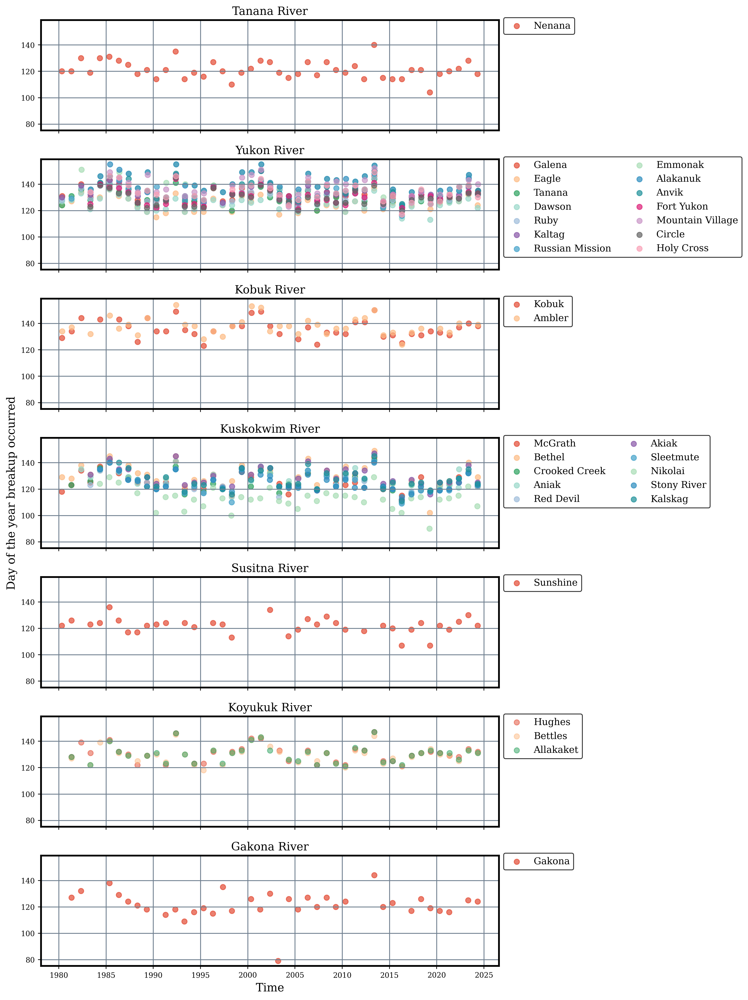

In [70]:
SAVE = True
STYLE = 'paper'
presentation_vs_poster(STYLE, (12, 16))

# Get unique rivers in the dataset
unique_rivers = dist_plot_data['River'].unique()
palette = sns.color_palette('Set3', n_colors=12)

# Create subplots
fig, axs = plt.subplots(nrows=len(unique_rivers), ncols=1, sharex=True, sharey=True)
# plt.subplots_adjust(left=0.1, right=None, bottom=None, top=None, wspace=None, hspace=0.1)

# Iterate through rivers
for idx, river in enumerate(unique_rivers):
    river_data = dist_plot_data[dist_plot_data['River'] == river]
    
    # Get unique sites for the current river
    unique_sites = river_data['Site'].unique()
    
    if river == 'Koyukuk River':
        alpha = 0.5
    else:
        alpha = 0.7

    # Plot each site on the current subplot
    for little_idx, site in enumerate(unique_sites):
        site_data = river_data[river_data['Site'] == site]
        site_data = return_site_info(site_data)
        axs[idx].scatter(site_data['Breakup Date'],
                      site_data['DayOfYear'],
                      label=(' ').join(site.split(' ')[:-2]),
                      linewidth=1.0, 
                      color = palettes.color_blind_colors[little_idx], 
                      alpha = alpha)
    
    axs[idx].set_title(river, fontsize='x-large')
    
    if river == 'Kuskokwim River':
        axs[idx].set_ylabel('Day of the year breakup occurred', fontsize = 'x-large')
        ncol = 2
    elif river == 'Yukon River':
        ncol = 2
    else:
        ncol = 1

    axs[idx].grid(color = 'slategrey')
    legend = axs[idx].legend(loc='upper left', fontsize='large', bbox_to_anchor=(1, 1.065), facecolor = vis['FACECOLOR'], ncol = ncol)
    legend.get_frame().set_edgecolor(vis['EDGE_color'])
    
axs[-1].set_xlabel('Time', fontsize = 'x-large')

plt.tight_layout()
if SAVE:
    plt.savefig(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/doy_over_time_{STYLE}.png', dpi = 350)

# Ice Thickness Record

In [12]:
ice_thickness = pd.read_csv('/mnt/locutus/remotesensing/r62/river_ice_breakup/river_ice_thickness/data/AlaskaMaxIceThickness_lakes_rivers_1962_2019.csv')
ice_thickness.drop([ice_thickness.columns[-1]], axis = 1, inplace = True)

# convert the dates to datetime
ice_thickness.loc[ice_thickness['ObservationDate'] == 'multiple', 'ObservationDate'] = pd.NaT
ice_thickness['ObservationDate'] = pd.to_datetime(ice_thickness['ObservationDate'], format='%m/%d/%Y')

ice_thickness.loc[ice_thickness['MaximumIceThicknessDate'] == 'multiple', 'MaximumIceThicknessDate'] = pd.NaT
ice_thickness['MaximumIceThicknessDate'] = pd.to_datetime(ice_thickness['MaximumIceThicknessDate'], format='%m/%d/%Y')

convert_dict = {'StationName': object,
                'Latitude': float,
                'Longitude' : float,
                'WaterBodyName' : object,
                'WateryBodyType' : object,
                'Year' : int,
                'ObservedIceThickness' : int,
                'AccumulatedFreezingDegreeDays' : float,
                }
 
ice_thickness = ice_thickness.astype(convert_dict)

ValueError: invalid literal for int() with base 10: 'multiple'

# Data Processing

## Reprojecting ARCADE dataset
Reprojection is off but the cells containing data appear to align with the qgis output that is in the orignal UTM projection

In [71]:
# The below step takes a minute to run

ARCADE = gpd.read_file('/mnt/locutus/remotesensing/r62/river_ice_breakup/ARCADE/ARCADE_v1_37_1km.shp', encoding='utf-8')
target_crs = CRS.from_epsg(4326)
ARCADE = ARCADE.to_crs(target_crs)
ARCADE_VARS = ['water_frac', 'twi_mean', 'perimeter', 'gravelius', 'cslope_mea']

In [15]:
summary_table = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/Breakup_Data/breakup_summary_table_at_least_35_records.pkl')

### Adding coordinates to the summary_table using my very large handmade set of locations

In [75]:
all_locations_at_least_10_breakups_1980_to_2023 = pd.read_csv('/mnt/locutus/remotesensing/r62/river_ice_breakup/Breakup_Data/breakup_locations_at_least_10_events_1980-2023.csv')
subset_lat_lon = all_locations_at_least_10_breakups_1980_to_2023[all_locations_at_least_10_breakups_1980_to_2023['Full Name'].isin(summary_table.index)]
summary_table['Latitude'] = np.array(subset_lat_lon['Latitude']).astype('float32')
summary_table['Longitude'] = np.array(subset_lat_lon['Longitude']).astype('float32')

## Creating a full dataset of all locations with at least 10 breakup records in APRFC 1980 - 2023

In [17]:
# all_locations_at_least_10_breakups_1980_to_2023 = pd.read_csv('/mnt/locutus/remotesensing/r62/river_ice_breakup/Breakup_Data/breakup_locations_at_least_10_events_1980-2023.csv')
# all_locations_at_least_10_breakups_1980_to_2023.set_index(['Full Name'], inplace = True)
# all_missing_1980_onward = pd.read_pickle(f'{path_to_breakup_records}/breakup_records_1980-2023_at_least_10_breakups.pkl')
# unique_values = all_missing_1980_onward[~all_missing_1980_onward.index.isin(all_locations_at_least_10_breakups_1980_to_2023.index)]
# print('Number of missing locations:', len(unique_values))

# all_missing_1980_onward.sort_index(inplace = True)
# all_locations_at_least_10_breakups_1980_to_2023.sort_index(inplace=True)

# # remove the extra locations I recorded lat lons for 
# all_locations_at_least_10_breakups_1980_to_2023 = all_locations_at_least_10_breakups_1980_to_2023.loc[all_locations_at_least_10_breakups_1980_to_2023.index.isin(all_missing_1980_onward.index)]

# # adding the year range and missing years
# all_locations_at_least_10_breakups_1980_to_2023[['Year Range', 'Years Missing']] = all_missing_1980_onward[['Year Range', 'Years Missing']]

Number of missing locations: 0


# Collecting Daymet Data (Pixel Extraction)

In [160]:
warnings.simplefilter("ignore")
build_daymet_and_holdout_dataset = True

if not os.path.exists('/mnt/locutus/remotesensing/r62/river_ice_breakup/Daymet_25_locations'):
    os.mkdir('/mnt/locutus/remotesensing/r62/river_ice_breakup/Daymet_25_locations')

if build_daymet_and_holdout_dataset:
    df_to_iter = summary_table
else:
    df_to_iter = all_locations_at_least_10_breakups_1980_to_2023

dfs = []
holdouts = []

for location_name, row in df_to_iter.iterrows():
    
    print('IMPORTING DAYMET DATA FOR LOCATION', location_name)
    location_name_underscored = location_name.replace(' ', '_')
    DF = pixel_extraction_tool_Daymet('1980-01-01',
                                  '2023-12-31',
                                  row.Latitude,
                                  row.Longitude,
                                  'all',
                                  f'/mnt/locutus/remotesensing/r62/river_ice_breakup/Daymet_25_locations/{location_name_underscored}',
                                  as_csv=False,
                                  Return = True)
    
    # Changing the column names and sorting
    DF.columns = ['Year', 'yday', 'dayl(s)', 'prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)','tmax(deg c)', 'tmin(deg c)', 'vp(Pa)']
    DF.sort_values(['Year', 'yday'], inplace = True)
    
    # Finding site coordinates to extract ARCADE data:
    LAT = df_to_iter[df_to_iter.index == location_name].Latitude[0]
    LON = df_to_iter[df_to_iter.index == location_name].Longitude[0]
    point_to_extract = Point(LON, LAT)
    
    # Sample the coordinates of the 5 static variables we are using from ARCADE dataset and add them to the dataframes
    ARCADE_data_to_add = np.array(ARCADE[ARCADE.geometry.contains(point_to_extract)][ARCADE_VARS], dtype = 'float32')

    # After visual inspection on QGIS using the code below I concluded that the second 
    # polygon of the two overlapping is the correct one so we will always choose the second
    
#     if ARCADE_data_to_add.shape == (2, 5):
#         print('LOCATION:', location_name, 'OVERLAPS TWO POLYGONS NEED TO CHOOSE MANUALLY')
#         print(ARCADE[ARCADE.geometry.contains(point_to_extract)][ARCADE_VARS])
#         print()
#         continue
        
#     else:
#         DF[ARCADE_VARS] = np.tile(ARCADE_data_to_add, (len(DF), 1))
    
    if ARCADE_data_to_add.shape == (2, 5):
        ARCADE_data_to_add = ARCADE_data_to_add[-1, :]
    elif ARCADE_data_to_add.shape == (0, 5):
        print('Skipping ', location_name, 'outside of ARCADE Shapefile')
        continue
    
    DF[ARCADE_VARS] = np.tile(ARCADE_data_to_add, (len(DF), 1))
    
    # Adding a Breakup date column, creating a datetime index and removing duplicate dates. Arbitrarily keeping the first date if there is a duplicate
    DF['Breakup Date'] = 0
    DF.index = pd.to_datetime(DF['Year'].astype(str) + DF['yday'].astype(str), format='%Y%j')
    DF = DF[~DF.index.duplicated(keep='first')]
    
    # Importing the breakup data for the given site
    df_breakup_data = break_up_data[break_up_data.Site == location_name]
    
    # Filling in the breakup dates with ones
    DF['Breakup Date'].loc[DF[DF.index.isin(df_breakup_data['Breakup Date'])].index] = 1
    
    # Adding the radians:
    converter = Pandas_Time_Converter(DF)
    DF = converter.create_time_vars()
    
    # Casting the variables:
    DF[['dayl(s)', 'prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)', 'tmax(deg c)', 'tmin(deg c)', 'vp(Pa)', 'COS_Radians', 'SIN_Radians']] = DF[['dayl(s)', 'prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)', 'tmax(deg c)', 'tmin(deg c)', 'vp(Pa)', 'COS_Radians', 'SIN_Radians']].astype('float32')
    DF[['Year', 'yday', 'Breakup Date']] = DF[['Year', 'yday', 'Breakup Date']].astype('int16')
    
    # Applying the mask to months that have had breakup events (i.e. assumes that all breakup events occur within March, April and May)
    missing_years = row['Years Missing']
    MASK = (DF.index.month.isin([4, 5, 6])) & (DF['Year'].isin(missing_years))
    DF['Mask'] = MASK
    DF['Location'] = location_name_underscored
    
    # combining all site locations to one list EXCEPT for the 5 holdout locations
    
    if location_name in holdout_locations:
        holdouts.append(DF)
    else:
        dfs.append(DF)

print()
print('PROCESS COMPLETE!')

IMPORTING DAYMET DATA FOR LOCATION Akiak Kuskokwim River


NameError: name 'holdout_locations' is not defined

## Combining dataframes into one large dataframe for model training

In [31]:
combined = pd.concat(dfs, axis=0)

# Sanity check AND Creating final dataset
dfs = []
for i in combined.groupby(['Year', 'Location']): # each grouping is 365 days
    if i[1].shape[0] != 365:
        print(i[0], 'HAS SHAPE:', i[1].shape)
    else:
        pass
    
    dfs.append(i[1])
    
print('SANITY CHECK AND TRAINING/TUNING DATASET CREATION COMPLETE')

combined = pd.concat(dfs, axis=0)
combined.drop(['yday'], axis = 1, inplace = True)

SANITY CHECK AND TRAINING/TUNING DATASET CREATION COMPLETE


# Final Processing Steps

### Creating final dataset covering as many locations as possible between 1980 - 2023 (proof of use as imputation method)

In [83]:
# mask = np.array(combined.pop('Mask'))
# actuals = np.array(combined.pop('Breakup Date'))
# locations = np.array(combined.pop('Location'))

# # normalizing the 25 locations here:
# combined, _, _ = normalize_df(combined, 'all', convert=True, subtract_min = True)

# dates = combined.index
# combined = mask_df_to_x(combined, mask, -1)
# combined.to_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/impute_missing_43_locations_at_least_10_1980-2023.pkl')

## Processing 5 Holdout Locations

In [ ]:
holdouts = pd.concat(holdouts, axis=0)

dfs = []
for i in holdouts.groupby(['Year', 'Location']): # each grouping is 365 days
    if i[1].shape[0] != 365:
        print(i[0], 'HAS SHAPE:', i[1].shape)
    else:
        pass
    
    dfs.append(i[1])
    
print('SANITY CHECK AND HOLDOUT DATASET CREATION COMPLETE')

holdouts = pd.concat(dfs, axis=0)
holdouts.drop(['yday'], axis = 1, inplace = True)

SANITY CHECK AND HOLDOUT DATASET CREATION COMPLETE


In [140]:
mins_maxes = pd.DataFrame()
mins_maxes['mins'] = test_daymet.min()
mins_maxes['maxes'] = test_daymet.max()

In [ ]:
# temp what are the mins and maxes
# print(combined.min(), combined.max())
mins_maxes = {}
mins_maxes['mins'] = combined.min()
mins_maxes['maxes'] = combined.max()

write_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_MINS_MAXES.pkl', mins_maxes)

## Creating Final Pickle file for LSTM

In [ ]:
mask = np.array(combined.pop('Mask'))
actuals = np.array(combined.pop('Breakup Date'))
locations = np.array(combined.pop('Location'))

# normalizing the 25 locations here:
combined, _, _ = normalize_df(combined, 'all', convert=True, subtract_min = True)

dates = combined.index

train_df, val_df, test_df = split_train_val_test(combined, PERC_TRAIN, PERC_VAL, how='sequential')
train_y, val_y, test_y = split_train_val_test(actuals, PERC_TRAIN, PERC_VAL, how='sequential')
train_dates, val_dates, test_dates = split_train_val_test(dates, PERC_TRAIN, PERC_VAL, how='sequential')
train_location, val_location, test_location = split_train_val_test(locations, PERC_TRAIN, PERC_VAL, how='sequential')
train_mask, val_mask, test_mask = split_train_val_test(mask, PERC_TRAIN, PERC_VAL, how='sequential')

# implimenting the mask but not on test data
train_df = mask_df_to_x(train_df, train_mask, -1) # Looks correct based on check!
val_df = mask_df_to_x(val_df, val_mask, -1)

pkl_dict = {}
pkl_dict['df'] = combined
pkl_dict['mask'] = mask

pkl_dict['train_df'] = train_df
pkl_dict['val_df'] = val_df
pkl_dict['test_df'] = test_df

pkl_dict['train_y'] = train_y
pkl_dict['val_y'] = val_y
pkl_dict['test_y'] = test_y

pkl_dict['train_dates'] = train_dates
pkl_dict['val_dates'] = val_dates
pkl_dict['test_dates'] = test_dates

pkl_dict['train_location'] = train_location
pkl_dict['val_location'] = val_location
pkl_dict['test_location'] = test_location

pkl_dict['NOTES'] = 'All data has been normlized to be between 0 and 1. \
The mins and maxes can be used to re-assign the data back to its original form. \
Input data is supplied by DayMet. Lookback = 457 = 365 + 92 (number of days in April + May + June + 1 \
which is masked for years that are missing breakup events)'

write_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_PRE_LSTM.pkl', pkl_dict)

## Creating Holdout Pickle

In [ ]:
# removing holdout mask and actuals 
# If I normalize holdout using combined df's maxes and mins
# the mins are less than 0 and the maxes greater than one for some features in holdout
# bad_holdouts below is only used to prove this point

mask = np.array(holdouts.pop('Mask')) # holdouts are not used for training so the mask is unnecessary here
actuals = np.array(holdouts.pop('Breakup Date'))
locations = np.array(holdouts.pop('Location'))

bad_holdouts = (holdouts - np.array(mins))/(np.array(maxes) - np.array(mins))
print(bad_holdouts.min(), '\n', bad_holdouts.max())

Year           -0.021672
dayl(s)         0.000000
prcp(mm/day)    0.000000
srad(W/m^2)     0.000000
swe(kg/m^2)     0.000000
tmax(deg c)    -0.001362
tmin(deg c)     0.003493
vp(Pa)          0.000081
water_frac      0.000000
twi_mean       -1.094216
perimeter       0.150327
gravelius      -0.355940
cslope_mea      0.755772
COS_Radians     0.000000
SIN_Radians     0.000000
dtype: float32 
 Year           -0.000000
dayl(s)         1.000000
prcp(mm/day)    1.059721
srad(W/m^2)     1.000153
swe(kg/m^2)     0.938238
tmax(deg c)     0.627270
tmin(deg c)     0.561005
vp(Pa)          0.967030
water_frac      0.054299
twi_mean       -0.155769
perimeter       1.013975
gravelius      -0.000000
cslope_mea      1.000007
COS_Radians     0.666667
SIN_Radians     0.666667
dtype: float32


## Normalizing the holdouts seperately to not have problems in weights/biases:

In [ ]:
holdouts_normed, _, _ = normalize_df(holdouts, 'all', convert=True, subtract_min = True)

pkl_dict = {}
pkl_dict['not_normed_df'] = holdouts
pkl_dict['df'] = holdouts_normed
pkl_dict['dates'] = holdouts.index
pkl_dict['locations'] = locations
pkl_dict['actuals'] = actuals

write_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_5_HOLDOUTS_PRE_LSTM.pkl', pkl_dict)

# Visualizing Daymet Results

### You can start the analysis from here if you are only interested in visualization
### Each Visualizing section should be able to run on its own

In [3]:
mins_maxes = read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_MINS_MAXES.pkl')
daymet_mins = np.array(mins_maxes['mins'])[0:15]
daymet_maxes = np.array(mins_maxes['maxes'])[0:15]

In [4]:
LOOKBACK_WINDOW = 457
data = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_PRE_LSTM.pkl')
print('PRIMAREY DATASET KEYS:')
print(data.keys())
print()

train_df = data['train_df']
val_df = data['val_df']
test_df = data['test_df']

train_y = data['train_y']
val_y = data['val_y']
test_y = data['test_y']

train_dates = data['train_dates']
val_dates = data['val_dates']
test_dates = data['test_dates']

y = np.concatenate([train_y, val_y, test_y])
sites = np.concatenate([data['train_location'], data['val_location'], data['test_location']])

# slick way to vectorize functions operating on np arrays
my_lambda = lambda x: x.replace('_', ' ')
remov_underscores = np.vectorize(my_lambda)

train_sites = remov_underscores(data['train_location'])
val_sites = remov_underscores(data['val_location'])
test_sites = remov_underscores(data['test_location'])

test_preds  = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/DAYMET/OUTPUT_LSTM_DAYMET_BAYESIAN_DAYMET')['predicted_probs']
val_preds = np.load(f'{path_to_outputs}/val_predictions.npy')[1:]

# Holdouts
holdout_pkl_data = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_5_HOLDOUTS_PRE_LSTM.pkl')
holdouts_preds = np.load('/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/Holdouts/holdout_predictions_1980-2022.npy')[1:]

holdouts_y = holdout_pkl_data['actuals']
holdouts_sites = remov_underscores(holdout_pkl_data['locations'])
holdouts_dates = holdout_pkl_data['dates']
holdouts_df = holdout_pkl_data['df']

print()
print('HOLDOUTS DATA KEYS:')
print(holdout_pkl_data.keys())

PRIMAREY DATASET KEYS:
dict_keys(['df', 'mask', 'train_df', 'val_df', 'test_df', 'train_y', 'val_y', 'test_y', 'train_dates', 'val_dates', 'test_dates', 'train_location', 'val_location', 'test_location', 'NOTES'])



FileNotFoundError: [Errno 2] No such file or directory: '/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/DAYMET/OUTPUT_LSTM_DAYMET_BAYESIAN_DAYMET'

In [10]:
final_datasets_path = '/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs'
path_to_outputs = '/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_Results/Output'
number_of_holdout_locations = 10
LOOKBACK_WINDOW = 457

my_lambda = lambda x: x.replace('_', ' ')
remov_underscores = np.vectorize(my_lambda)

holdout_pkl_data = pd.read_pickle(f'{final_datasets_path}/DAYMET_{number_of_holdout_locations}_HOLDOUTS_PRE_LSTM.pkl')
holdouts_LH_Function = np.load(f'{path_to_outputs}/Holdouts/holdout_predictions_1980-2023.npy')[1:]

holdouts_actuals = holdout_pkl_data['actuals'][LOOKBACK_WINDOW:]
holdouts_sites = remov_underscores(holdout_pkl_data['locations'])[LOOKBACK_WINDOW:]
holdouts_dates = holdout_pkl_data['dates'][LOOKBACK_WINDOW:]
holdouts_df = holdout_pkl_data['df'][LOOKBACK_WINDOW:]
holdouts_mins = holdout_pkl_data['mins_maxes_df']['mins'][0:15]
holdouts_maxes = holdout_pkl_data['mins_maxes_df']['maxes'][0:15]

print('holdouts_preds', len(holdouts_LH_Function))
print('holdouts_sites', len(holdouts_sites))
print('holdouts_dates', len(holdouts_dates))
print('holdouts_df', len(holdouts_df))
print('holdouts_actuals', len(holdouts_actuals))

holdouts_preds 160143
holdouts_sites 160143
holdouts_dates 160143
holdouts_df 160143
holdouts_actuals 160143


In [11]:
def create_plot_df_and_doy_df(normed_df,
                              dates, 
                              sites, 
                              mins, 
                              maxes, 
                              actuals, 
                              LH_Function, 
                              float_vars_to_include=['tmax(deg c)', 'tmin(deg c)'], 
                              un_normalize_df=True):
    DF = normed_df.copy()

    if un_normalize_df:
        DF = (DF * (maxes - mins)) + mins

    # Creating plot data
    plot_data = DF[float_vars_to_include].copy()
    plot_data['sites'] = sites
    plot_data['actuals'] = actuals
    plot_data['LH_Function'] = LH_Function
    plot_data['dates'] = pd.to_datetime(dates)

    plot_data['Predicted_Breakup'] = 0
    plot_data.reset_index(inplace=True, drop=True)

    plot_data[float_vars_to_include] = plot_data[float_vars_to_include].astype('float32')
    plot_data['year'] = plot_data['dates'].dt.year
    plot_data['DOY'] = plot_data['dates'].dt.dayofyear

    # Mark predicted breakups
    plot_data['Predicted_Breakup'] = plot_data.groupby(['sites', 'year'])['LH_Function'].transform(lambda x: (x == x.max()).astype(int))

    # Create DOY DataFrame
    doy_df_rows = []
    grouped = plot_data.groupby(['sites', 'year'])
    for (site, year), group in grouped:
        if group['actuals'].sum() == 1:
            predicted_doy = group.loc[group['Predicted_Breakup'] == 1, 'DOY'].values[0]
            actual_doy = group.loc[group['actuals'] == 1, 'DOY'].values[0]
            doy_df_rows.append({'sites': site, 'year': year, 'predicted_doy': predicted_doy, 'actual_doy': actual_doy})

    doy_df = pd.DataFrame(doy_df_rows, columns=['sites', 'year', 'predicted_doy', 'actual_doy'])
    doy_df = doy_df.astype({'year': 'int64', 'predicted_doy': 'int64', 'actual_doy': 'int64'})

    return plot_data, doy_df


plot_data_holdouts, doy_df_holdouts = create_plot_df_and_doy_df(holdouts_df,
                          holdouts_dates,
                          holdouts_sites,
                          holdouts_mins, 
                          holdouts_maxes, 
                          holdouts_actuals, 
                          holdouts_LH_Function)

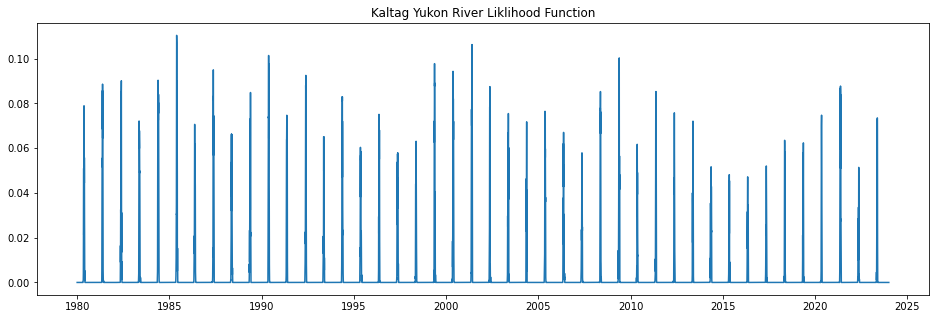

In [23]:
location = 'Kaltag Yukon River'
single_loc = plot_data_holdouts[ plot_data_holdouts.sites == location]

plt.figure(figsize=(16, 5))
plt.plot(single_loc.dates, single_loc.LH_Function)
plt.title(f'{location} Liklihood Function');

In [ ]:
lh_function = np.load('/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_Results/Output/Main/')

### Get MAPE scores

In [30]:
mapes_table = []
new_doy_df_test.sort_values(by = 'sites', inplace=True)
for site_data in new_doy_df_test.groupby('sites'):
    site_name = site_data[0]
    df_site = site_data[1]
    mape_location = mean_absolute_percentage_error(df_site.actual_doy, df_site.predicted_doy)*100
    mape_location = round(mape_location, 3)
    row = {'sites' : site_name,
           'MAPE' : mape_location}
    mapes_table = mapes_table.append(row)
mapes_table = pd.DataFrame(mapes_table)
mapes_table

""


## Assessment Statistics

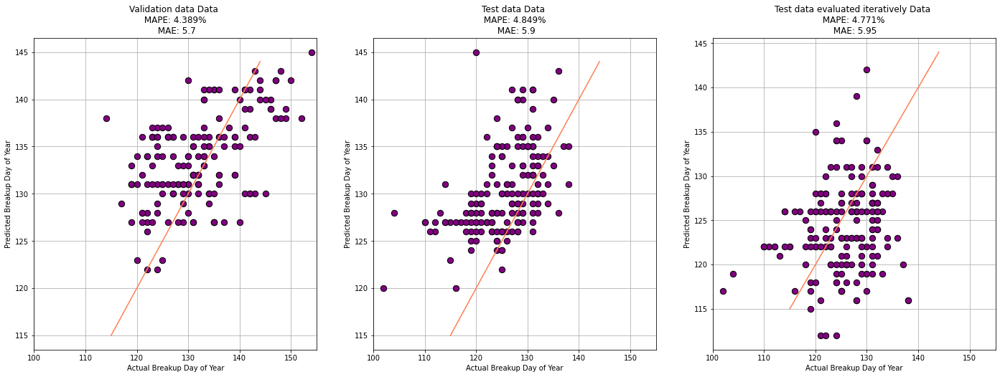

In [11]:
bias = 0

fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (24, 8))

for idx, i in enumerate([doy_df_val, doy_df_test, new_doy_df_test]):
    r2 = r2_score(i.actual_doy, i.predicted_doy - bias)
    r2 = round(r2, 3)
    mape = mean_absolute_percentage_error(i.actual_doy, i.predicted_doy - bias)*100
    mape = round(mape, 3)

    if idx == 0:
        title = 'Validation data'
    elif idx == 1:
        title = 'Test data'
    elif idx == 2:
        title = 'Test data evaluated iteratively'

    mae = np.mean(np.abs(i.actual_doy - i.predicted_doy))
    mae = round(mae, 2)
    axs[idx].set_title(f'{title} Data \n MAPE: {mape}% \n MAE: {mae}') # \n R-squared: {r2}
    axs[idx].scatter(i.actual_doy, i.predicted_doy - bias,
                      color = 'purple',
                      edgecolor = 'black',
                      s= 70,
                      zorder = 10)
    axs[idx].plot(np.arange(115, 145), np.arange(115, 145),
                  color = 'coral', zorder = 15)
    axs[idx].set_xlabel('Actual Breakup Day of Year')
    axs[idx].set_ylabel('Predicted Breakup Day of Year')
    axs[idx].set_xlim((100, 155))
    axs[idx].grid()

## Creating box plots

In [26]:
new_doy_df_test['residual_doy'] = new_doy_df_test['actual_doy'] - new_doy_df_test['predicted_doy']
new_doy_df_test['residual_doy'] = new_doy_df_test['residual_doy'].astype('int64')

box_plot_list = []
Years = []
for i in new_doy_df_test.groupby('year'):
    arr = np.array(i[1].residual_doy)
    box_plot_list.append(arr)
    Years.append(int(i[0]))

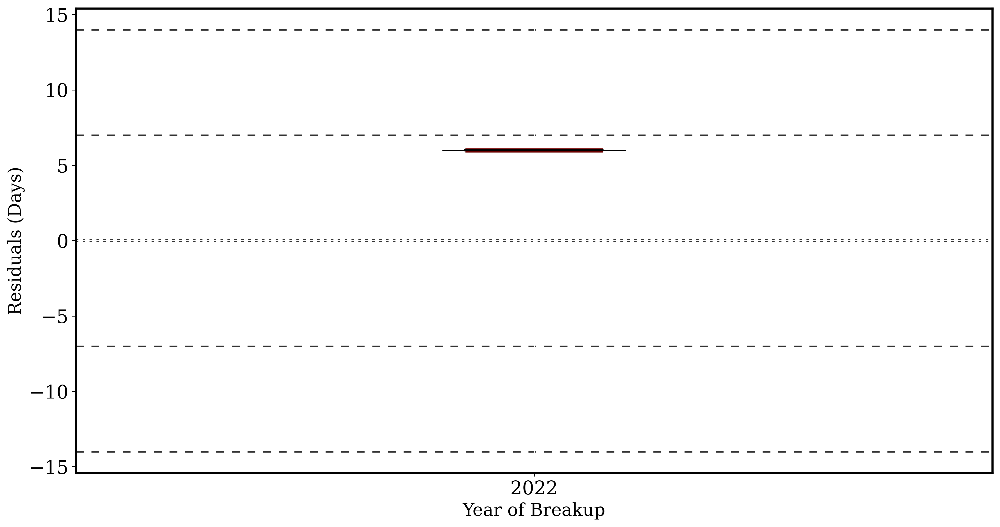

In [27]:
STYLE = 'paper'
vis = presentation_vs_poster(STYLE, (13.5, 7.2))

params = {'ytick.labelsize' : 18,
          'xtick.labelsize' : 18}

plt.rcParams.update(params)

# Horizontal lines
HLINES = [-14, -7, 0, 7, 14]

fig, ax = plt.subplots()

fig.patch.set_facecolor(vis['FACECOLOR'])
ax.set_facecolor(vis['FACECOLOR'])

for v in HLINES:
    if v == 0:
        ax.axhline(v, color=vis['EDGE_color'], alpha=0.8, zorder=0, linewidth = 2.5, ls = 'dotted')
    else:
        ax.axhline(v, color=vis['EDGE_color'], ls=(0, (5, 5)), alpha=0.8, zorder=0)
    
# The output is stored in 'violins', used to customize their appearence
violins = ax.violinplot(
    box_plot_list, 
    positions=Years,
    widths=0.2,
    bw_method="scott",
    showmeans=False, 
    showmedians=False,
    showextrema=False
)

# Customize violins (remove fill, customize line, etc.)
for pc in violins["bodies"]:
    pc.set_facecolor("none")
    pc.set_edgecolor('black')
    pc.set_linewidth(0.85)
    pc.set_alpha(1)
    

# Add boxplots ---------------------------------------------------
# Note that properties about the median and the box are passed
# as dictionaries.

medianprops = dict(
    linewidth=4, 
    color='turquoise',
    linestyle = 'solid',
    solid_capstyle="butt", 
    zorder = 5
)

if STYLE.lower() == 'paper':
    meanprops = dict(
        linewidth = 4,
        color = 'maroon',
        linestyle = 'solid',
        solid_capstyle="butt", 
        zorder = 5
    )

elif STYLE.lower() == 'poster':
    meanprops = dict(
        linewidth = 4,
        color = 'coral',
        linestyle = 'solid',
        solid_capstyle="butt", 
        zorder = 5
    )
    
flierprops = dict(marker='o', markerfacecolor=vis['FACECOLOR'], markersize=8, linestyle='none', markeredgecolor= vis['EDGE_color'])
capprops = dict(linewidth=2, color= vis['EDGE_color'])
whiskerprops = dict(linewidth=2, color=vis['EDGE_color'])  
boxprops = dict(linewidth=2, color=vis['EDGE_color'], zorder = 10)

ax.boxplot(
    box_plot_list,
    positions=Years, 
    showfliers = True, # show the outliers beyond the caps.
    showcaps = True,   # show the caps
    showbox=True,
    meanline = True,
    showmeans = True,
    meanprops = meanprops,
    medianprops = medianprops,
    boxprops = boxprops,
    whiskerprops=whiskerprops,
    flierprops=flierprops,
    capprops=capprops,
);

ax.grid(color = vis['FACECOLOR'])
ax.set_ylabel('Residuals (Days)', color= vis['EDGE_color'], fontsize = 'x-large')
ax.set_xlabel('Year of Breakup', color= vis['EDGE_color'], fontsize = 'x-large')
ax.set_xticks(Years)
# ax.set_title('Boxplots: Distributions of Residuals Over Time \n Across 20 Sites \n', fontsize=20, fontweight = 'bold', color=vis['EDGE_color'])

plt.tight_layout()
# plt.savefig(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/boxplots_20_sites_{STYLE}.png');

## Fitting model to 43 relatively incomplete locations

In [6]:
entire_43_locations_X = pd.read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/impute_missing_43_locations_at_least_10_1980-2023.pkl')
entire_43_locations_preds = np.load('/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/DAYMET/predictions_for_43_locations_1980-2023.npy')
entire_43_locations_X = entire_43_locations_X.iloc[456:, :]
entire_43_locations_X['Prediction_LLH'] = entire_43_locations_preds
del entire_43_locations_preds

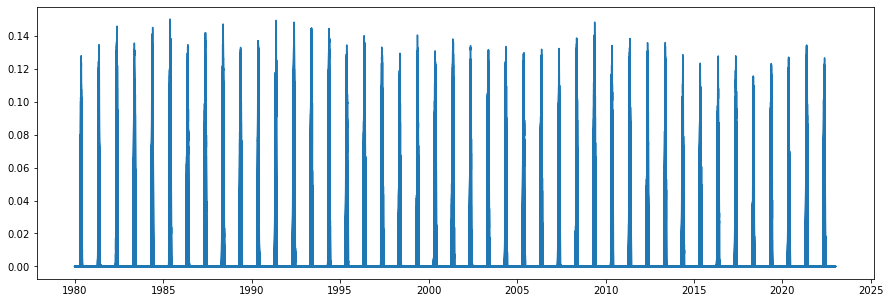

In [11]:
plt.figure(figsize = (15, 5))
plt.plot(entire_43_locations_X.Prediction_LLH)

In [9]:
entire_43_plot_data, entire_43_doy_df_test = create_plot_df_and_doy_df(entire_43_locations_X,
                              entire_43_locations_X.index, 
                              entire_43_locations_X.Locations, 
                              daymet_mins, 
                              daymet_maxes,
                              entire_43_locations_X.Actual_Breakup,
                              entire_43_locations_X.Prediction_LLH,
                              float_vars_to_include = ['tmax(deg c)', 'tmin(deg c)'], 
                              un_normalize_df = False, 
                              LOOKBACK_WINDOW = 457)

KeyboardInterrupt: 

In [ ]:
mapes_table = pd.DataFrame()
entire_43_doy_df_test.sort_values(by = 'sites', inplace=True)
for site_data in entire_43_doy_df_test.groupby('sites'):
    site_name = site_data[0]
    df_site = site_data[1]
    mape_location = mean_absolute_percentage_error(df_site.actual_doy, df_site.predicted_doy)*100
    mape_location = round(mape_location, 3)
    row = {'sites' : site_name,
           'MAPE' : mape_location}
    mapes_table = mapes_table.append(row, ignore_index=True)

mapes_table

### Quick plot of one location over time

In [ ]:
train_df = (train_df*(daymet_maxes - daymet_mins)) + daymet_mins
train_df['locations'] = data['train_location']
train_df['breakup_dates_bool'] = train_y
dawson_train_df = train_df[train_df.locations == 'Dawson_Yukon_River']

dawson_train_df[['dayl(s)', 'prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)',
       'tmax(deg c)', 'tmin(deg c)', 'vp(Pa)', 'water_frac', 'twi_mean',
       'perimeter', 'gravelius', 'cslope_mea', 'COS_Radians', 'SIN_Radians']] = dawson_train_df[['dayl(s)', 'prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)',
       'tmax(deg c)', 'tmin(deg c)', 'vp(Pa)', 'water_frac', 'twi_mean',
       'perimeter', 'gravelius', 'cslope_mea', 'COS_Radians', 'SIN_Radians']].astype('float32')

dawson_train_df[['Year']] = dawson_train_df[['Year']].astype('int16')
dawson_train_df = dawson_train_df[dawson_train_df['Year'] >= 2001]

/home/r62/anaconda3/lib/python3.9/site-packages/pandas/core/frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


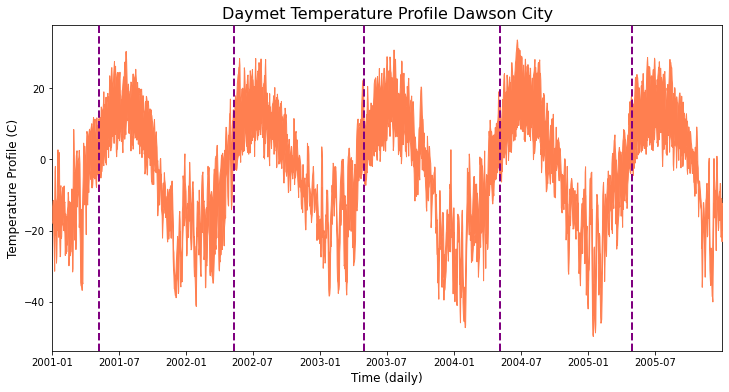

In [ ]:
dawson_breakup_dates = dawson_train_df[dawson_train_df.breakup_dates_bool == 1].index

fig, axs = plt.subplots(figsize = (12, 6))
axs.fill_between(dawson_train_df.index, y1=dawson_train_df['tmin(deg c)'], y2=dawson_train_df['tmax(deg c)'], zorder = 5, color = 'coral')
axs.set_ylabel('Temperature Profile (C)', fontsize = 12)
axs.set_xlabel('Time (daily)', fontsize = 12)
axs.set_title('Daymet Temperature Profile Dawson City', fontsize = 16)
axs.set_xlim((dawson_train_df.index.min(), dawson_train_df.index.max()))
for DATE in dawson_breakup_dates:
    axs.axvline(DATE, linestyle='dashed', color = 'purple', zorder = 10, linewidth = 2.0);
    
plt.savefig('/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/dawson_temp_profile.png', dpi = 330)

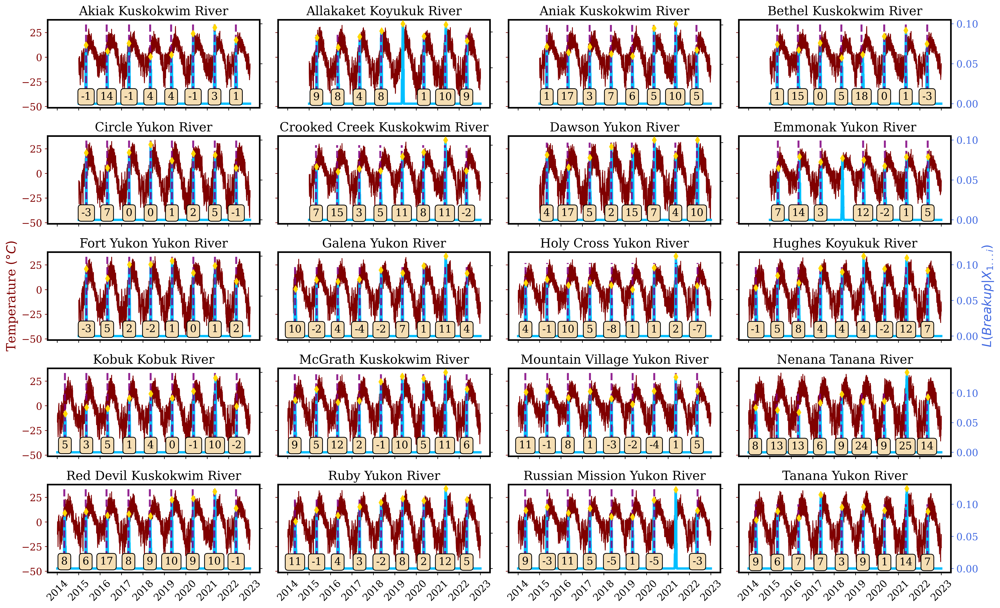

In [ ]:
warnings.filterwarnings("ignore", category=FutureWarning)

STYLE = 'paper'
vis = presentation_vs_poster(STYLE, (18, 11))

pd.options.mode.chained_assignment = None

fig, axs = plt.subplots(nrows=5, ncols=4, sharex=True, sharey = 'all')
# plt.subplots_adjust(hspace=0.3, wspace=0.1)
plt.xticks(rotation=45)

# fig.suptitle("River Ice Break-up Likelihood Functions \n and Temperature Profile [Daymet]", fontsize=plot_title_size, fontweight='bold', y=0.93, color = general_text_color)

number_days_off_by = []
dfs = []
total_differences = []

table = pd.DataFrame(columns=['location', 'min', 'max', 'std', 'mean'])
props_1 = dict(boxstyle='round', facecolor='wheat', alpha=1.0, zorder = 20)
fig.patch.set_facecolor(vis['FACECOLOR'])

axs = axs.ravel()

for idx, (ax, DF) in enumerate(zip(axs, plot_data.groupby('sites'))):
    
    # a chunk of 2014 was still present as a flatline in the plot which was throwing off the function to find the local max
    if DF[0] == 'Lake Creek Yentna River':
        data_by_site = DF[1]
        data_by_site = data_by_site[data_by_site.dates >= '2015-01-01']
    else:
        data_by_site = DF[1]
        
    data_by_site = data_by_site.sort_values('dates')
    
    true_break_up_dates = np.array(data_by_site['dates'][data_by_site['actuals'] == 1].dt.date)
    predicted_break_up_dates = get_breakup_dates_by_yr(data_by_site)
    
    breakup_indices = plot_data[(plot_data.sites == DF[0]) & (plot_data.dates).isin(predicted_break_up_dates)]['Predicted_Breakup'].index
    plot_data['Predicted_Breakup'].loc[breakup_indices] = 1
    
    ax.set_title(DF[0], fontsize = 'x-large')
    ax.tick_params(axis='y', colors=vis['second_axs_col'])
    
    if idx == 8:
        ax.set_ylabel('Temperature $(\u00b0C)$', color=vis['second_axs_col'], fontsize='x-large')
        
    ax.tick_params(axis='x', rotation=45)
    ax.fill_between(data_by_site['dates'],
                     np.array(data_by_site['tmin(deg c)']),
                     np.array(data_by_site['tmax(deg c)']),
                     color = vis['second_axs_col'],
                     label='Temperature',
                     zorder = 1)
    
    ax.set_facecolor(vis['FACECOLOR'])
            
    ax2 = ax.twinx()
       
    ax2.plot(data_by_site['dates'], data_by_site['preds'], linewidth = 3, color = 'deepskyblue')
    ax2.scatter(predicted_break_up_dates, data_by_site['preds'][data_by_site.dates.isin(predicted_break_up_dates)],
                     color = 'gold',
                     alpha=1.0,
                     zorder = 5, 
                     marker = 'd') # predicted
    
    ax2.vlines(true_break_up_dates,
                    ymin=0,
                    ymax=0.1,
                    color = 'purple',
                    linestyles = 'dashed',
                    linewidth = 2.5,
                    alpha=0.85,
                    zorder = 3) # actual
    
    ax2.set_xlabel('Time')
    
    if idx == 11:
        ax2.set_ylabel(r'$L(Breakup | X_{1...i})$', color = 'royalblue', fontsize = 'x-large')
    
    if idx in [3, 7, 11, 15, 19]:
        ax2.tick_params(axis='y', colors = 'royalblue')
        
    else:
        ax2.set_yticklabels([])
        
    # ax2.grid(color = 'slategrey')
    
    mismatch_years = find_pred_vs_actual_mismatch(predicted_break_up_dates, true_break_up_dates)
    abs_differences = date_difference(predicted_break_up_dates, true_break_up_dates, True)
    differences = date_difference(predicted_break_up_dates, true_break_up_dates, False)
    
    # adding differences to data_by_site:
    data_by_site['Days_off_by'] = 0
    actuals_idx = data_by_site[data_by_site.actuals == 1].index
    data_by_site['Days_off_by'].loc[actuals_idx] = differences
    dfs.append(data_by_site)
    
    data_to_add = {'location': DF[0], 'min': np.min(abs_differences),
                   'max': np.max(abs_differences),
                   'std': np.std(abs_differences),
                   'mean': np.mean(abs_differences)}
    
    total_differences.append(abs_differences)
    table = table.append(data_to_add, ignore_index = True)
    
    number_days_off_by.append(differences)
    
    for x, num in zip(true_break_up_dates, differences):
        ax2.text(x, 0.005, str(num), ha='center', fontsize='large', bbox=props_1, color = 'black')
        
plt.tight_layout()
# plt.savefig(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/Daymet_20_sites_forecast_{STYLE}.png', dpi = 450)

pd.options.mode.chained_assignment = 'warn'

## Close look at Shapley values

In [133]:
shapley_df = pd.read_csv('/mnt/locutus/remotesensing/r62/river_ice_breakup/Results/DAYMET_25_LOCATIONS/Output/Shapley_Analysis/shapley_values.csv').iloc[:, 1:]
shapley_df['dates'] = pd.to_datetime(shapley_df.dates)

biased_shap_cols = ['dates', 'dayl(s)_shap_value',
       'prcp(mm/day)_shap_value', 'srad(W/m^2)_shap_value',
       'swe(kg/m^2)_shap_value', 'tmax(deg c)_shap_value',
       'tmin(deg c)_shap_value', 'vp(Pa)_shap_value', 'water_frac_shap_value',
       'twi_mean_shap_value', 'perimeter_shap_value', 'gravelius_shap_value',
       'cslope_mea_shap_value', 'COS_Radians_shap_value',
       'SIN_Radians_shap_value',]

shapley_df = shapley_df[biased_shap_cols]
shapley_df.set_index('dates', inplace = True)

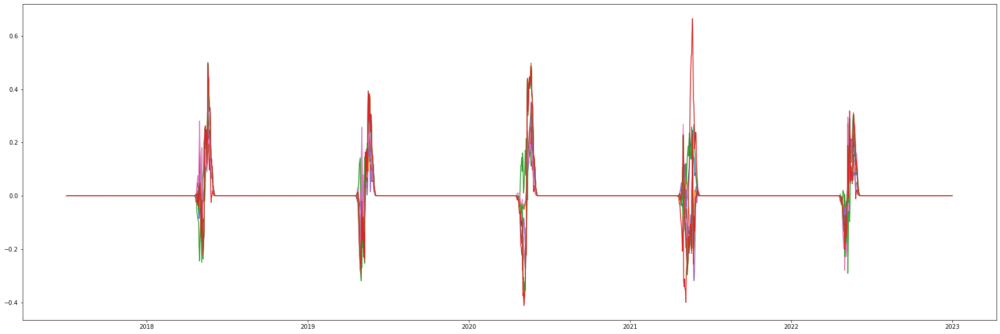

In [143]:
plt.figure(figsize = (30, 10))
plt.plot(shapley_df);

## Testing out Niave Model

In [ ]:
daymet_data = read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_Daymet_datasets/DAYMET_20_LOCATIONS_PRE_LSTM.pkl')
print(daymet_data.keys())

val_df = daymet_data['val_df']
val_df['locations'] = daymet_data['val_location']

test_df = daymet_data['test_df']
test_df['locations'] = daymet_data['test_location']
test_years = test_df.index.year.unique()

val_test_df = pd.concat([val_df, test_df], axis = 0)

val_test_df['actuals'] = np.concatenate([daymet_data['val_y'], daymet_data['test_y']])
val_test_df.reset_index(inplace = True)
val_test_df.rename(columns = {'index':'dates'}, inplace = True)

dict_keys(['df', 'mask', 'train_df', 'val_df', 'test_df', 'train_y', 'val_y', 'test_y', 'train_dates', 'val_dates', 'test_dates', 'train_location', 'val_location', 'test_location', 'mins_maxes_df', 'NOTES'])


In [8]:
unique_locations = val_test_df.locations.unique()
val_test_df = val_test_df[val_test_df.actuals == 1]

diffs = []

for location in unique_locations:
    temp_df = val_test_df[val_test_df.locations == location]['dates']

    for idx in range(1, len(temp_df)):
        current_date = temp_df.iloc[idx]
        previous_date = temp_df.iloc[idx-1]

        if previous_date.year == current_date.year - 1:
            diff = current_date.dayofyear - previous_date.dayofyear
            diffs.append(diff)
        else:
            diffs.append(np.nan)

In [23]:
unique_locations = val_test_df.locations.unique()
val_test_df = val_test_df[val_test_df.actuals == 1]

diffs = []
mapes = []

for location in unique_locations:
    temp_df = val_test_df[val_test_df.locations == location]['dates']

    for idx in range(1, len(temp_df)):
        current_date = temp_df.iloc[idx]
        previous_date = temp_df.iloc[idx-1]

        if previous_date.year == current_date.year - 1:
            diff = current_date.dayofyear - previous_date.dayofyear
            diffs.append(diff)

            mape = np.abs(diff/current_date.dayofyear)
            mapes.append(mape)

        else:
            diffs.append(np.nan)

print('MAE NAIVE MODEL:', round(np.nanmean(np.abs(np.array(diffs))), 3))
print('SDAR NAIVE MODEL:', round(np.nanstd(np.abs(np.array(diffs))), 3))
print('MAX NAIVE MODEL:', round(np.nanmax(np.abs(np.array(diffs))), 3))
print('MIN NAIVE MODEL:', round(np.nanmin(np.abs(np.array(diffs))), 3))
print('MAPE NAIVE MODEL:', round(100*np.nanmean(np.abs(np.array(mapes))), 3))

In [27]:
print('MAE NAIVE MODEL:', round(np.nanmean(np.abs(np.array(diffs))), 3))
print('SDAR NAIVE MODEL:', round(np.nanstd(np.abs(np.array(diffs))), 3))
print('MAX NAIVE MODEL:', round(np.nanmax(np.abs(np.array(diffs))), 3))
print('MIN NAIVE MODEL:', round(np.nanmin(np.abs(np.array(diffs))), 3))
print('MAPE NAIVE MODEL:', round(100*np.nanmean(np.abs(np.array(mapes))), 3))

MAE NAIVE MODEL: 7.046
SDAR NAIVE MODEL: 6.082
MAX NAIVE MODEL: 28.0
MIN NAIVE MODEL: 0.0
MAPE NAIVE MODEL: 5.509


In [9]:
diffs, location_list, year_list = [], [], []
years = np.array(test_df.index.year.unique(), dtype='int64')

for i in val_test_df.groupby('locations'):
    location_df = i[1]
    location = i[0]
    
    for year in years:
        annual_df = location_df[location_df['dates'].dt.year == year]
        annual_breakup_date = annual_df[annual_df.actuals == 1].dates
        
        if annual_breakup_date.size == 0:
            continue
        
        past_df = location_df[location_df['dates'].dt.year == (year - 1)]
        if past_df.shape[0] == 0:
            pass
        
        elif past_df[past_df.actuals == 1].shape[0] == 0:
            pass
        
        else:
            past_breakup_date = past_df[past_df.actuals == 1].dates
            
            month_past = int(past_breakup_date.dt.month)
            day_past = int(past_breakup_date.dt.day)
            
            month_current = int(annual_breakup_date.dt.month)
            day_current = int(annual_breakup_date.dt.day)
            year_current = int(annual_breakup_date.dt.year)
            
            # assumes the same year as current (moving the past date to this year)
            past = pd.Timestamp(f'{year_current}-{month_past}-{day_past}')
            current = pd.Timestamp(f'{year_current}-{month_current}-{day_current}')
            
            diff = (current - past).days

            diffs.append(float(diff))
            location_list.append(location)
            year_list.append(year)
            
results = pd.DataFrame({'Year': year_list, 
                        'Difference': diffs,
                        'Location': location_list})

TypeError: cannot convert the series to <class 'int'>

These results seem correct after check some locations and year

In [ ]:
year_to_test = 2017
location_to_test = 'Emmonak_Yukon_River'

print('RESULTS')
print()
print(results[(results.Location == location_to_test) & (results.Year == year_to_test)])
print()
past_date_obs = val_test_df[(val_test_df.locations == location_to_test) & (val_test_df.dates.dt.year == year_to_test-1) & (val_test_df.actuals == 1)].dates
current_date_obs = val_test_df[(val_test_df.locations == location_to_test) & (val_test_df.dates.dt.year == year_to_test) & (val_test_df.actuals == 1)].dates

print('PAST DATE:', past_date_obs)
print('CURRENT DATE:', current_date_obs)

RESULTS

    Year  Difference             Location
64  2017        11.0  Emmonak_Yukon_River

PAST DATE: 77138   2016-05-03
Name: dates, dtype: datetime64[ns]
CURRENT DATE: 84448   2017-05-14
Name: dates, dtype: datetime64[ns]


In [5]:
results.head()

,Year,Difference,Location
0,2014,-23.0,Akiak_Kuskokwim_River
1,2015,2.0,Akiak_Kuskokwim_River
2,2016,-15.0,Akiak_Kuskokwim_River
3,2017,16.0,Akiak_Kuskokwim_River
4,2018,-3.0,Akiak_Kuskokwim_River


In [7]:
results['abs(residuals)'] = results['Difference'].abs()
results_table = pd.DataFrame()
results_table['min_abs_res'] = np.array(results.groupby('Location').min()['abs(residuals)'], dtype = 'int64')
results_table['max_abs_res'] = np.array(results.groupby('Location').max()['abs(residuals)'], dtype = 'int64')
results_table['std_abs_res'] = np.array(results.groupby('Location').std()['abs(residuals)'].round(2))
results_table['mean_abs_res'] = np.array(results.groupby('Location').mean()['abs(residuals)'].round(2))
results_table.index = results.Location.unique()
print('OVERALL MEAN:', round(results['abs(residuals)'].mean(), 3))
print('OVERALL STD:', round(results['abs(residuals)'].std(), 3))
print('OVERALL MAX:', round(results['abs(residuals)'].max(), 3))
print('OVERALL MIN:', round(results['abs(residuals)'].min(), 3))

results_table

OVERALL MEAN: 7.333
OVERALL STD: 7.004
OVERALL MAX: 28.0
OVERALL MIN: 0.0


,min_abs_res,max_abs_res,std_abs_res,mean_abs_res
Akiak_Kuskokwim_River,0,23,7.99,8.44
Allakaket_Koyukuk_River,1,23,7.78,6.29
Aniak_Kuskokwim_River,2,25,8.49,7.44
Bethel_Kuskokwim_River,1,27,9.72,12.00
Circle_Yukon_River,1,14,4.84,5.78
Crooked_Creek_Kuskokwim_River,0,20,6.38,6.22
Dawson_Yukon_River,1,15,5.12,7.78
Emmonak_Yukon_River,1,24,7.92,9.00
Fort_Yukon_Yukon_River,1,15,5.17,5.67
Galena_Yukon_River,1,21,6.32,5.67


In [ ]:
print('OVERALL ABS(AVERAGE):', round(results.Difference.abs().mean(), 2))

results_abs = copy.copy(results)
results_abs.drop(['Year'], axis = 1, inplace = True)

results_table = pd.DataFrame()
results_table['Location'] = results_abs.Location.unique()

results_abs['ABS(Residual)'] = results['Difference'].abs()
results_table['Mean(diff)'] = np.squeeze(np.array(results_abs.groupby('Location').mean('ABS(Residual)').round(2)))
results_table

OVERALL ABS(AVERAGE): 7.33


ValueError: Wrong number of items passed 2, placement implies 1

In [ ]:
np.array(results_abs.groupby('Location').mean('ABS(Residual)').round(2))

array([[-2.44,  8.44],
       [-2.86,  6.29],
       [-2.78,  7.44],
       [-2.67, 12.  ],
       [-1.11,  5.78],
       [-1.56,  6.22],
       [-0.89,  7.78],
       [-1.86,  9.  ],
       [-1.22,  5.67],
       [-1.67,  5.67],
       [-1.22,  9.44],
       [-2.11,  4.78],
       [-1.44,  5.44],
       [-1.67,  7.44],
       [-2.44,  8.67],
       [-2.  ,  7.78],
       [-1.44,  5.89],
       [-1.56,  5.78],
       [-2.57, 12.57],
       [-1.67,  5.89]])

In [ ]:
results_abs

,Difference,Location,ABS(Residual)
0,-23.0,Akiak_Kuskokwim_River,23.0
1,2.0,Akiak_Kuskokwim_River,2.0
2,-15.0,Akiak_Kuskokwim_River,15.0
3,16.0,Akiak_Kuskokwim_River,16.0
4,-3.0,Akiak_Kuskokwim_River,3.0
...,...,...,...
169,-3.0,Tanana_Yukon_River,3.0
170,-2.0,Tanana_Yukon_River,2.0
171,2.0,Tanana_Yukon_River,2.0
172,0.0,Tanana_Yukon_River,0.0


In [ ]:
results_abs.Location.unique()

array(['Akiak_Kuskokwim_River', 'Allakaket_Koyukuk_River',
       'Aniak_Kuskokwim_River', 'Bethel_Kuskokwim_River',
       'Circle_Yukon_River', 'Crooked_Creek_Kuskokwim_River',
       'Dawson_Yukon_River', 'Emmonak_Yukon_River',
       'Fort_Yukon_Yukon_River', 'Galena_Yukon_River',
       'Holy_Cross_Yukon_River', 'Hughes_Koyukuk_River',
       'Kobuk_Kobuk_River', 'McGrath_Kuskokwim_River',
       'Mountain_Village_Yukon_River', 'Nenana_Tanana_River',
       'Red_Devil_Kuskokwim_River', 'Ruby_Yukon_River',
       'Russian_Mission_Yukon_River', 'Tanana_Yukon_River'], dtype=object)

In [ ]:
np.squeeze(np.array(results_abs.groupby('Location').mean('Difference').round(2)))

array([ 8.44,  6.29,  7.44, 12.  ,  5.78,  6.22,  7.78,  9.  ,  5.67,
        5.67,  9.44,  4.78,  5.44,  7.44,  8.67,  7.78,  5.89,  5.78,
       12.57,  5.89])

In [ ]:
daymet_data = read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_PRE_LSTM.pkl')

moving_means_df_train = pd.DataFrame()
moving_means_df_train['locations'] = np.concatenate([daymet_data['train_location'], daymet_data['val_location']])
moving_means_df_train['dates'] = np.concatenate([daymet_data['train_dates'], daymet_data['val_dates']])
moving_means_df_train['actuals'] = np.concatenate([daymet_data['train_y'], daymet_data['val_y']])
moving_means_df_train = moving_means_df_train[moving_means_df_train.actuals == 1]
moving_means_df_train = moving_means_df_train.sort_values(by = ['locations', 'dates'])

In [ ]:
for group in moving_means_df_train.groupby(by='locations'):
    print(group[1])

                    locations      dates  actuals
22030   Akiak_Kuskokwim_River 1983-05-11        1
36642   Akiak_Kuskokwim_River 1985-05-23        1
43934   Akiak_Kuskokwim_River 1986-05-15        1
51234   Akiak_Kuskokwim_River 1987-05-15        1
65828   Akiak_Kuskokwim_River 1989-05-09        1
73123   Akiak_Kuskokwim_River 1990-05-04        1
87744   Akiak_Kuskokwim_River 1992-05-24        1
95022   Akiak_Kuskokwim_River 1993-05-03        1
102324  Akiak_Kuskokwim_River 1994-05-05        1
109624  Akiak_Kuskokwim_River 1995-05-05        1
116929  Akiak_Kuskokwim_River 1996-05-09        1
124220  Akiak_Kuskokwim_River 1997-05-01        1
131521  Akiak_Kuskokwim_River 1998-05-02        1
138835  Akiak_Kuskokwim_River 1999-05-16        1
146130  Akiak_Kuskokwim_River 2000-05-10        1
153436  Akiak_Kuskokwim_River 2001-05-17        1
160735  Akiak_Kuskokwim_River 2002-05-16        1
168021  Akiak_Kuskokwim_River 2003-05-02        1
175321  Akiak_Kuskokwim_River 2004-05-01        1


/home/r62/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


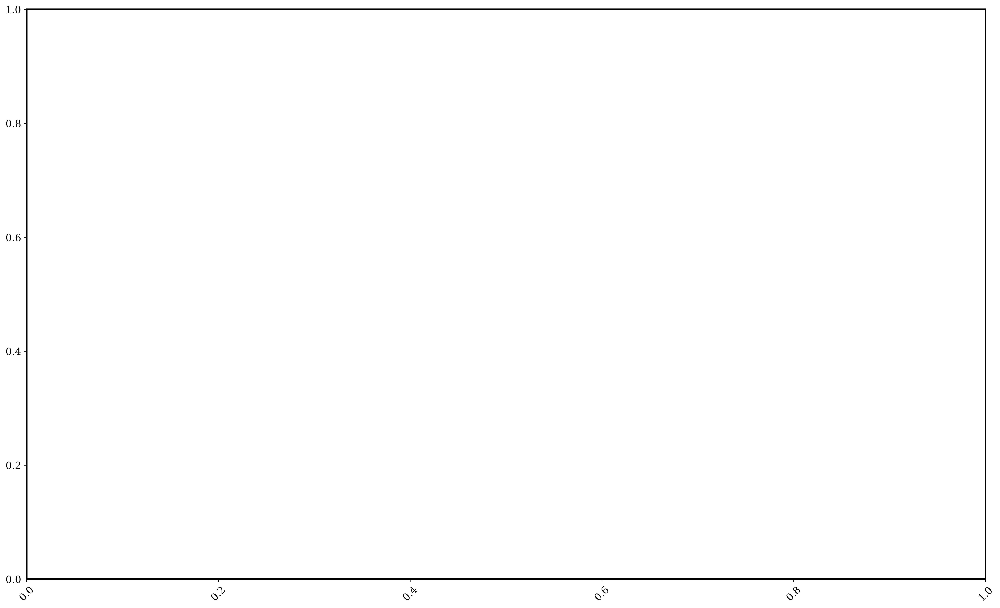

In [ ]:
data_by_site = plot_data[plot_data.sites == 'Dawson Yukon River']

fig, axs = plt.subplots(nrows=1, ncols=1, figsize=(18, 11))
plt.xticks(rotation=45)

number_days_off_by = []
dfs = []
total_differences = []

fig.patch.set_facecolor('white')

data_by_site = data_by_site.sort_values('dates')

true_break_up_dates = np.array(data_by_site['dates'][data_by_site['actuals'] == 1].dt.date)
predicted_break_up_dates = get_breakup_dates_by_yr(data_by_site)

breakup_indices = plot_data[(plot_data.sites == DF[0]) & (plot_data.dates).isin(predicted_break_up_dates)][
    'Predicted_Breakup'].index
plot_data['Predicted_Breakup'].loc[breakup_indices] = 1

ax.set_title('Breakup Liklihood Curve and Temperature Profile Dawson City', fontsize='x-large')
ax.tick_params(axis='y', colors=vis['second_axs_col'])

ax.tick_params(axis='x', rotation=45)
ax.fill_between(data_by_site['dates'],
                np.array(data_by_site['tmin(deg c)']),
                np.array(data_by_site['tmax(deg c)']),
                color=vis['second_axs_col'],
                label='Temperature',
                zorder=1)

ax.set_facecolor(vis['FACECOLOR'])

ax2 = ax.twinx()

ax2.plot(data_by_site['dates'], data_by_site['preds'], linewidth=3, color='deepskyblue')
ax2.scatter(predicted_break_up_dates,
            data_by_site['preds'][data_by_site.dates.isin(predicted_break_up_dates)],
            color='gold',
            alpha=1.0,
            zorder=5, marker='d')  # predicted

ax2.vlines(true_break_up_dates,
            ymin=0,
            ymax=0.1,
            color='purple',
            linestyles='dashed',
            linewidth=2.5,
            alpha=0.85,
            zorder=3)  # actual

ax2.set_xlabel('Time')

ax2.set_ylabel(r'$L(Breakup | X_{1...i})$', color='royalblue', fontsize='x-large')

plt.tight_layout()
plt.show()

# Visualizing ECMWF dataset Results
### must be DL environment (sorry)

In [ ]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import copy 

sys.path.append('/home/r62/repos/russ_repos/river_ice_breakup')
from RIVER_ICE_FUNCTIONS import presentation_vs_poster
from TIME import Pandas_Time_Converter, int_to_month_name
from STANDARD_FUNCTIONS import read_pickle
from TF_FUNCTIONS import load_model, df_to_LSTM
from VISUALIZATION_FUNCTIONS import presentation_vs_poster, Color_Palettes

sys.path.append('/home/r62/repos/russ_repos/river_ice_breakup')
from RIVER_ICE_FUNCTIONS import presentation_vs_poster
palettes = Color_Palettes()
color_blind_colors = palettes.color_blind_colors

col_blind_friendly_palette = palettes.color_blind_friendly()

MONTHS = ['Feb', 'March', 'April', 'May', 'June']
YEARS = ['2019', '2020', '2021', '2022']
number_of_ensembles = 51

2024-03-04 16:27:25.700589: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-04 16:27:26.323965: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64/mpich-3.2/lib:/home/r62/anaconda3/lib:/home/r62/anaconda3/lib
2024-03-04 16:27:26.324038: I tensorflow/compiler/xla/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-03-04 16:27:32.368725: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinf

In [ ]:
hist_daymet = read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_PRE_LSTM.pkl')
df = hist_daymet['df']
df['Location'] = np.concatenate([hist_daymet['train_location'], hist_daymet['val_location'], hist_daymet['test_location']])
df = df[df.index.year.isin([2018, 2019, 2020, 2021, 2022])]
locations = np.array(df['Location'])

# We need mins and maxes to un-normalize the data:
mins_maxes = read_pickle('/mnt/locutus/remotesensing/r62/river_ice_breakup/final_inputs/DAYMET_25_LOCATIONS_MINS_MAXES.pkl')
daymet_mins = np.array(mins_maxes['mins'])[0:15]
daymet_maxes = np.array(mins_maxes['maxes'])[0:15]

df = df.iloc[:, 0:15]*(daymet_maxes - daymet_mins) + daymet_mins

## Visualizing the ECMWF Embedded Dataset

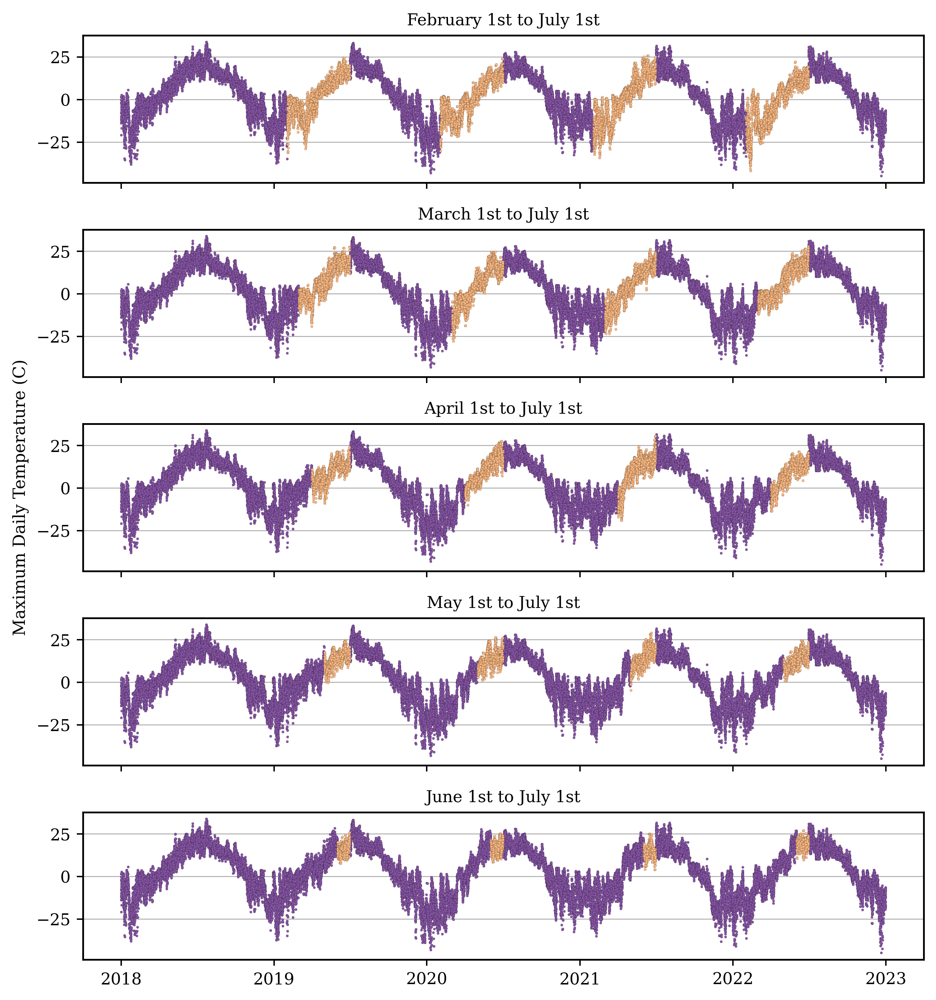

In [ ]:
STYLE = 'paper'
vis = presentation_vs_poster(STYLE, (7.5, 8))
plt.rcParams.update({'axes.linewidth' : 1})

ens = 32
# variables = ['prcp(mm/day)', 'srad(W/m^2)', 'swe(kg/m^2)', 'tmax(deg c)', 'tmin(deg c)', 'vp(Pa)']
var = 'tmax(deg c)'

fig, axs = plt.subplots(nrows=len(MONTHS), ncols=1, sharex=True, sharey=True)
# plt.subplots_adjust(left=0.1, right=None, bottom=None, top=None, wspace=None, hspace=0.1)

for idx, MONTH in enumerate(MONTHS):

    month_number = int_to_month_name([MONTH])[0]
    month_number = str(month_number).zfill(2)
    df_embed_by_timespan = pd.read_pickle(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/ERA5/monthly_forecasts/differing_spans/{MONTH.lower()}/processed/ensembles/ENSEMBLE_{ens}.pkl')
    
    # un-normalizing the embedded dataset:
    df_embed_by_timespan = df_embed_by_timespan.iloc[:, 0:15]*(daymet_maxes - daymet_mins) + daymet_mins
    
    timeframe_mask = ((df_embed_by_timespan.index > f'{month_number}-01-2019') & (df_embed_by_timespan.index < '07-01-2019')) | \
    ((df_embed_by_timespan.index > f'{month_number}-01-2020') & (df_embed_by_timespan.index < '07-01-2020')) | \
    ((df_embed_by_timespan.index > f'{month_number}-01-2021') & (df_embed_by_timespan.index < '07-01-2021')) | \
    ((df_embed_by_timespan.index > f'{month_number}-01-2022') & (df_embed_by_timespan.index < '07-01-2022'))
    
    month_name = int_to_month_name([int(month_number)-1], full_name=True)[0]
    axs[idx].set_title(f'{month_name} 1st to July 1st')
    axs[idx].grid(axis = 'y', linestyle='-', linewidth=0.5, color='darkgrey')
    
    axs[idx].scatter(df_embed_by_timespan.index[timeframe_mask],
                     df_embed_by_timespan[var][timeframe_mask],
                     color = color_blind_colors[1],
                     edgecolor = 'black',
                     linewidth=0.05,
                     s=2,
                     zorder = 10,
                     alpha = 1.0,
                     label = 'CCDS')
    
    axs[idx].scatter(df[~timeframe_mask].index,
                     df[~timeframe_mask][var],
                     color = color_blind_colors[5],
                     edgecolor = 'black',
                     linewidth=0.05,
                     s=2,
                     zorder = 5,
                     label = 'Daymet',
                     alpha = 1.0,)
    
    if idx == 2:
        axs[idx].set_ylabel('Maximum Daily Temperature (C)')
               
plt.tight_layout()

plt.savefig('/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/ECMWF_embedding_plots.png', dpi = 330, facecolor = 'white');

## Producing Predictions

### Creating mean ensembles (don't run the cell below)

In [ ]:
# for MONTH in MONTHS:
#     ensembles_for_time_span = []
#     for ens in range(number_of_ensembles):
        
#         df_embed_by_timespan = pd.read_pickle(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/ERA5/monthly_forecasts/differing_spans/{MONTH.lower()}/processed/ensembles/ENSEMBLE_{ens}.pkl')
#         locations = df_embed_by_timespan.pop('Location')
#         df_embed_by_timespan = df_embed_by_timespan.astype('float32')
        
#         if ens == 0:
#             COLUMNS = df_embed_by_timespan.columns
#             INDEX = df_embed_by_timespan.index
            
#         ensembles_for_time_span.append(np.array(df_embed_by_timespan))
    
#     ensembles_for_time_span = np.stack(ensembles_for_time_span)
#     ensembles_for_time_span = np.average(ensembles_for_time_span, axis = 0)
#     ensembles_for_time_span = pd.DataFrame(ensembles_for_time_span)
#     ensembles_for_time_span.columns = COLUMNS
#     ensembles_for_time_span.set_index(INDEX, inplace=True)
#     ensembles_for_time_span['Location'] = locations
    
#     ensembles_for_time_span.to_pickle(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/ERA5/monthly_forecasts/differing_spans/{MONTH.lower()}/processed/ensembles/ENSEMBLE_MEAN.pkl')

## Running model
#### see code: repos/russ_repos/river_ice_breakup/Post_Analysis/Forecast_Ensembles.py

## Assembling the Forecast Results

In [ ]:
# 4 years, 20 locations, 51 ensembles + mean ensemble, 5 time spans

data_collection = []
for ens in range(number_of_ensembles): # number_of_ensembles
    for MONTH in MONTHS:

        results_df = pd.read_pickle(f'/mnt/locutus/remotesensing/r62/river_ice_breakup/ERA5/monthly_forecasts/differing_spans/results/{MONTH.lower()}/ENSEMBLE_{ens}.pkl')
        results_df.drop(['2018'], inplace=True, axis=1)
        results_df[['2019', '2020', '2021', '2022']] = results_df[['2019', '2020', '2021', '2022']].astype('float32')
        results_df['Ensemble'] = ens
        results_df['time_span'] = MONTH
        data_collection.append(results_df)
        
data_collection = pd.concat(data_collection)

data_collection[['2019', '2020', '2021', '2022']] = data_collection[['2019', '2020', '2021', '2022']].astype('float32')

data_collection = data_collection.melt(id_vars=['Location', 'Ensemble', 'time_span'], 
                    value_vars=['2019', '2020', '2021', '2022'], 
                    var_name='Year', value_name='Residuals (Days)')

# residuals are actuals - predicted my code has it backwards:
data_collection['Residuals (Days)'] = data_collection['Residuals (Days)']*(-1)

# Proper Casting:
data_collection['Year'] = data_collection['Year'].astype('int16')
data_collection['Ensemble'] = data_collection['Ensemble'].astype('int16')

In [ ]:
for year in [2019, 2020, 2021, 2022]:
    for f_range in ['Feb', 'March', 'April', 'May', 'June']:
        data = data_collection[(data_collection['Year'] == year) & (data_collection['time_span'] == f_range)]['Residuals (Days)'].abs() # (data_collection['Year'] == year) & (data_collection['time_span'] == f_range)
        n = data[~np.isnan(data)].shape[0]
        MAE = round(np.mean(data), 2)
        SDAR = round(np.nanstd(data), 2)
        print(f' {year} {f_range}')
        print(n)
        # print('MAE:', MAE, 'SDAR:', SDAR, 'n:', n)
        print()

 2019 Feb
969

 2019 March
969

 2019 April
969

 2019 May
561

 2019 June
0

 2020 Feb
1020

 2020 March
1020

 2020 April
1020

 2020 May
867

 2020 June
0

 2021 Feb
969

 2021 March
969

 2021 April
969

 2021 May
867

 2021 June
0

 2022 Feb
1020

 2022 March
1020

 2022 April
1020

 2022 May
1020

 2022 June
0



/home/r62/anaconda3/envs/DL/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1670: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [ ]:
for f_range in ['Feb', 'March', 'April', 'May', 'June']:
    data = data_collection[(data_collection['time_span'] == f_range)]['Residuals (Days)'].abs() # (data_collection['Year'] == year) & (data_collection['time_span'] == f_range)
    n = data[~np.isnan(data)].shape[0]
    MAE = round(np.mean(data), 2)
    SDAR = round(np.nanstd(data), 2)
    print(f' {f_range}')
    print('MAE:', MAE, 'SDAR:', SDAR, 'n:', n)
    print()

 Feb
MAE: 9.33 SDAR: 7.16 n: 3978

 March
MAE: 9.54 SDAR: 7.14 n: 3978

 April
MAE: 9.43 SDAR: 7.16 n: 3978

 May
MAE: 6.52 SDAR: 5.33 n: 3315

 June
MAE: nan SDAR: nan n: 0



## Create figure for all ensembles but one location

In [ ]:
def round_to_n_decimal_places(list_of_numbers):
    
    '''
    Right now this only works for 2 decimal places
    '''
    
    if type(list_of_numbers) != list:
        list_of_numbers = [list_of_numbers]
    
    for number in list_of_numbers:
    
        # Split the number into the integer and fractional parts
        integer_part, _, fractional_part = str(number).partition('.')

        # Handle case where there is no fractional part
        if not fractional_part:
            return f"{number:.2f}"

        # If the fractional part is less than or equal to 2 digits, format to ensure two digits after the decimal
        if len(fractional_part) <= 2:
            return f"{number:.2f}"
        else:
            # If more than two digits after the decimal, round to two digits
            return f"{number:.2f}"

def create_boxplot_data(data_by_location):
    DATA = []
    for i in data_by_location.groupby(['Year', 'month_int']):
        DATA.append(i[1]['Residuals (Days)'].values)
    return DATA

def make_each_boxplot(data_indices_list, color):
    
    placement_list = [i+1 for i in data_indices_list]
    parts = ax.violinplot([DATA[i] for i in data_indices_list], placement_list, showmeans=False, showextrema=True, showmedians=False)
    ax.scatter(x = placement_list, y=[medians[i] for i in data_indices_list], marker='o', color='cyan', edgecolor='black', s=15, zorder=3)
    
    for pc in parts['bodies']:
        pc.set_facecolor(color)
        pc.set_edgecolor('black')
        pc.set_alpha(1)
        
    for partname in ('cbars', 'cmins', 'cmaxes',):
        parts[partname].set_edgecolor('black')
        parts[partname].set_linewidth(1)

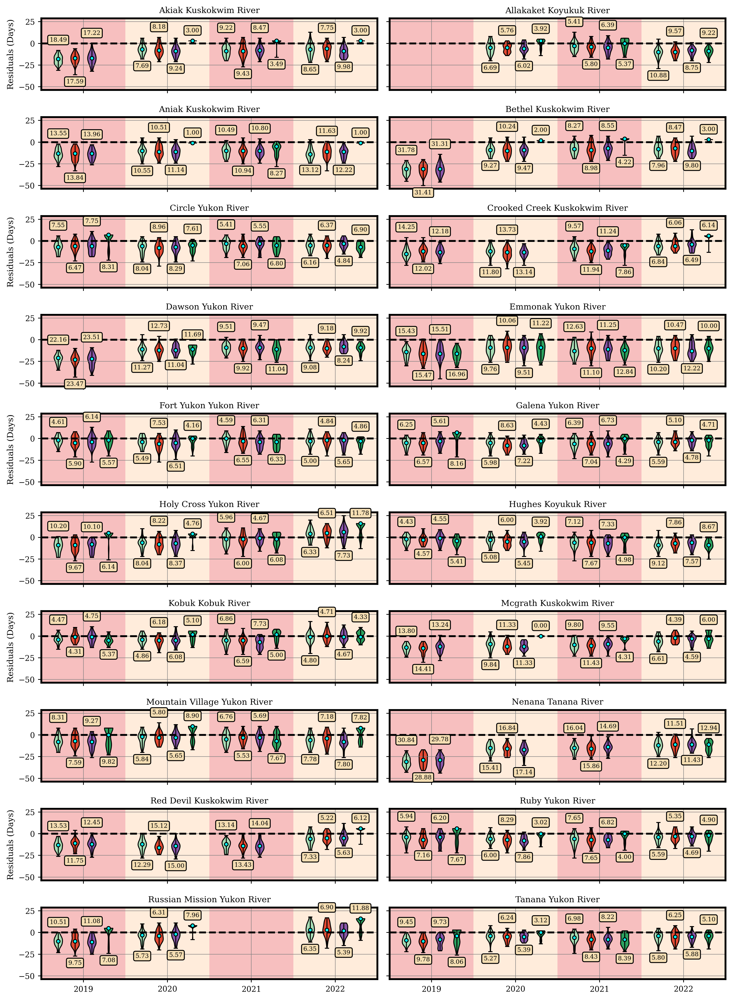

In [ ]:
warnings.filterwarnings("ignore")

STYLE = 'paper'
vis = presentation_vs_poster(STYLE, (11, 15))
fig, axs = plt.subplots(nrows = 10, ncols = 2, sharex=True, sharey = True)

locations = data_collection.Location.unique()
data_collection['month_int'] = int_to_month_name(data_collection['time_span'], False)

for idx, (location, ax) in enumerate(zip(locations, axs.flat)):
    
    loc_name = location.split('_')
    loc_name = [i.capitalize() for i in loc_name]
    loc_name = (' ').join(loc_name)
    
    data_by_location = data_collection[data_collection.Location == location]
    
    # Find the absolute means:
    data_by_loc = copy.copy(data_by_location)
    data_by_loc['Residuals (Days)'] = data_by_loc['Residuals (Days)'].abs()
    means = data_by_loc.groupby(['Year', 'month_int'])['Residuals (Days)'].mean().reset_index()['Residuals (Days)'].values
    del data_by_loc
    
    # Find the medians:
    medians = data_by_location.groupby(['Year', 'month_int'])['Residuals (Days)'].median().reset_index()['Residuals (Days)'].values
    
    DATA = create_boxplot_data(data_by_location)
    
    for l_idx, (mean, d) in enumerate(zip(means, DATA)):
        if np.isnan(mean):
            
            continue
            
        else:
            
            # mean = round(mean, 2)
            formatted_mean = str(round_to_n_decimal_places(mean))
            
            if l_idx % 2 == 0:
            
                YPOS = np.nanmax(d) + 10
                
            else:
                
                YPOS = np.nanmin(d) - 10
            ax.text(x = (l_idx + 1), y = YPOS, s = formatted_mean,
                          ha='center',
                          fontsize=6.5,
                          bbox=dict(facecolor='wheat',
                                    edgecolor='black',
                                    boxstyle='round'))
            
    
    ax.axhline(y=0, color='black', linestyle='dashed', linewidth=2.0)
    ax.axvspan(0, 5, facecolor='lightcoral', alpha=0.5)
    ax.axvspan(5, 10, facecolor='peachpuff', alpha=0.5)
    ax.axvspan(10, 15, facecolor='lightcoral', alpha=0.5)
    ax.axvspan(15, 20, facecolor='peachpuff', alpha=0.5)
    ax.set_xlim((0, 20))
    
    # Setting ylabel:
    if idx == 0:
        ax.set_ylabel('Residuals (Days)')
        
    elif idx % 2 == 1:
        pass
    
    elif idx % 4 == 0:
        ax.set_ylabel('Residuals (Days)')
    
    # Fixing the tick problems:
    custom_ticks = [2.5, 7.5, 12.5, 17.5]
    custom_labels = ['2019', '2020', '2021', '2022']

    ax.set_xticks(custom_ticks)
    ax.set_xticklabels(custom_labels)
    
    # Feb
    make_each_boxplot([0, 5, 10, 15], color_blind_colors[7])
        
    # March
    make_each_boxplot([1, 6, 11, 16], color_blind_colors[0])
           
    # April
    make_each_boxplot([2, 7, 12, 17], color_blind_colors[5])
        
    # May
    make_each_boxplot([3, 8, 13, 18], color_blind_colors[2])
           
    # June
    make_each_boxplot([4, 9, 14, 19], color_blind_colors[3])
        
    ax.grid(True, linestyle='-', linewidth=0.5, color='grey')
    ax.set_title(loc_name, fontsize=9)
    
plt.tight_layout()
plt.savefig('/mnt/locutus/remotesensing/r62/river_ice_breakup/Images/Daymet_Results/ECMWF_Results.png', dpi = 400)
plt.show()